#Mount Drive

In [1]:
from google.colab import drive
drive.mount('/content/gdrive')
%cd /content/gdrive/My\ Drive/15anb/

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).
/content/gdrive/My Drive/15anb


#Imports

In [2]:
import glob
import os
import time
import torch
import cudas
import datetime
import torchvision
import numpy as np
from torch import nn
from pathlib import Path
from tensorflow import summary
from matplotlib import pyplot as plt
from torch.utils.data import DataLoader
from dataset import createdataset
from Net import Model
from utils import utils

CUDA Available? True


#Tensorboard files

In [0]:
current_time = str(datetime.datetime.now().timestamp())
train_log_dir = 'logs_train/tensorboard/train/'+current_time
test_log_dir = 'logs_test/tensorboard/test/'+current_time
train_summary_writer = summary.create_file_writer(train_log_dir)
test_summary_writer = summary.create_file_writer(test_log_dir)

#Unzip data

In [4]:
t0 = time.time()
!mkdir /content/ZData
!mkdir /content/ZData/Background/
!mkdir /content/ZData/OverlayedImages/
!mkdir /content/ZData/OverlayedMasks/
!mkdir /content/ZData/DepthImage/
!unzip -q /content/gdrive/My\ Drive/ZippedFiles/Background.zip -d /content/ZData/Background/
!unzip -q /content/gdrive/My\ Drive/ZippedFiles/OverlayedImages.zip -d /content/ZData/OverlayedImages/
!unzip -q /content/gdrive/My\ Drive/ZippedFiles/DepthImage.zip -d /content/ZData/DepthImage/
!unzip -q /content/gdrive/My\ Drive/ZippedFiles/OverlayedMasks.zip -d /content/ZData/OverlayedMasks/
!unzip -q /content/gdrive/My\ Drive/ZippedFiles/OverlayedImages1.zip -d /content/ZData/OverlayedImages/
!unzip -q /content/gdrive/My\ Drive/ZippedFiles/OverlayedImages2.zip -d /content/ZData/OverlayedImages/
!unzip -q /content/gdrive/My\ Drive/ZippedFiles/OverlayedImages3.zip -d /content/ZData/OverlayedImages/
!unzip -q /content/gdrive/My\ Drive/ZippedFiles/DepthImage1.zip -d /content/ZData/DepthImage/
!unzip -q /content/gdrive/My\ Drive/ZippedFiles/DepthImage2.zip -d /content/ZData/DepthImage/
!unzip -q /content/gdrive/My\ Drive/ZippedFiles/DepthImage3.zip -d /content/ZData/DepthImage/
!unzip -q /content/gdrive/My\ Drive/ZippedFiles/OverlayedMasks1.zip -d /content/ZData/OverlayedMasks/
!unzip -q /content/gdrive/My\ Drive/ZippedFiles/OverlayedMasks2.zip -d /content/ZData/OverlayedMasks/
!unzip -q /content/gdrive/My\ Drive/ZippedFiles/OverlayedMasks3.zip -d /content/ZData/OverlayedMasks/
!rm -rf ZData/Background/Thumbs.db
!rm -rf /content/ZData/OverlayedImages/*/Thumbs.db
!rm -rf /content/ZData/OverlayedMasks/*/Thumbs.db
!rm -rf /content/ZData/DepthImage/*/Thumbs.db
!rm -rf /content/ZData/OverlayedImages/30/combined_s47_p16_it30.jpg
!rm -rf /content/ZData/OverlayedMasks/30/combined_s47_p16_it30.jpg
!rm -rf /content/ZData/DepthImage/30/combined_s47_p16_it30.jpg
!rm -rf /content/ZData/DepthImage/20/combined_s9_p61_it20.jpg
!rm -rf /content/ZData/OverlayedImages/20/combined_s9_p61_it20.jpg
!rm -rf /content/ZData/OverlayedMasks/20/combined_s9_p61_it20.jpg
print('{} seconds'.format(time.time() - t0))

559.1647250652313 seconds


In [0]:
root_dir = '/content/ZData/'
maps = utils.getmaps()
f2 = utils.getmaps1('OverlayedImages/')
f3 = utils.getmaps1('OverlayedMasks/')
f4 = utils.getmaps1('DepthImage/')
f2x=Path(root_dir+'OverlayedImages/')
f2_files = list(sorted(f2x.glob('*/*.jpg')))
len_G = len((f2_files))

#Get Length of complete dataset

In [4]:
print(sum([len(files) for r,d, files in os.walk('/content/ZData/Background/')]))
print(sum([len(files) for r,d, files in os.walk('/content/ZData/OverlayedImages/')]))
print(sum([len(files) for r,d, files in os.walk('/content/ZData/DepthImage/')]))
print(sum([len(files) for r,d, files in os.walk('/content/ZData/OverlayedMasks/')]))

100
399998
399998
399998


In [8]:
utils.getmeanstd('/content/ZData/Background/*.jpg')
utils.getmeanstd('/content/ZData/OverlayedImages/*/*.jpg')
utils.getmeanstd('/content/ZData/OverlayedMasks/*/*.jpg')
utils.getmeanstd('/content/ZData/DepthImage/*/*.jpg')


Mean: - [0.4487602910539218, 0.3666878339460785, 0.30795229473039226]
stdDev: - [0.225889674410426, 0.21692880761838323, 0.20793324978827588]


Mean: - [0.4535596182396004, 0.37567284220540065, 0.32152507237182537]
stdDev: - [0.23850198502032313, 0.2295517697609356, 0.22437527171737068]


Mean: - [0.07862858715316354, 0.07862858715316354, 0.07862858715316354]
stdDev: - [0.25420386323417027, 0.25420386323417027, 0.25420386323417027]


Mean: - [0.35120074844460747, 0.35120074844460747, 0.35120074844460747]
stdDev: - [0.19563056714301064, 0.19563056714301064, 0.19563056714301064]


([0.35120074844460747, 0.35120074844460747, 0.35120074844460747],
 [0.19563056714301064, 0.19563056714301064, 0.19563056714301064])

#Loading Dataset with transform this time and sending it to dataloader
Added seed(0) to maintain consistency in train and val set irrespective of loading multiple times

In [5]:
torch.manual_seed(0)
root_dir = '/content/ZData/'
t0 = time.time()
train_ds = createdataset.LoadDataset(root_dir, maps, f2, f3, f4, len_G)
#val_ds = LoadDataset(root_dir, test_transform)
train_set, val_set = torch.utils.data.random_split(train_ds, [280000, 119998])
#t1, val_set = torch.utils.data.random_split(val_ds, [280000, 119998])
train_dl = DataLoader(train_set, batch_size = 16, shuffle=True, pin_memory=True, num_workers=8 )
val_dl = DataLoader(val_set, batch_size = 16, shuffle=True, pin_memory=True )
print('{} seconds'.format(time.time() - t0))

0.07709288597106934 seconds


#Load sample data to check Background, background+Foreground, Masks and Depths are in Sync

In [0]:
sample1 = iter(train_dl)
torch.cuda.empty_cache()
t0 = time.time()
sample = next(sample1)
print(time.time()-t0)
[(k, v.shape) for k, v in sample.items()]

0.8960103988647461


[('f1_image', torch.Size([32, 3, 128, 128])),
 ('f2_image', torch.Size([32, 3, 128, 128])),
 ('f3_image', torch.Size([32, 1, 128, 128])),
 ('f4_image', torch.Size([32, 1, 128, 128]))]

#Display Background Image

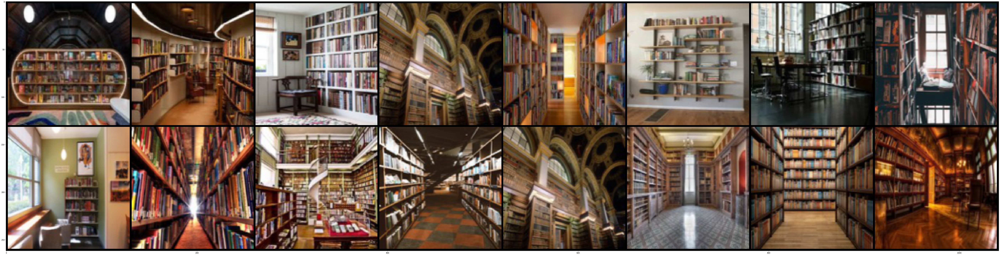

In [0]:
imgs = sample["f1_image"].resize_(16,3,128,128)
utils.show1(imgs)

#Display Foreground+Background

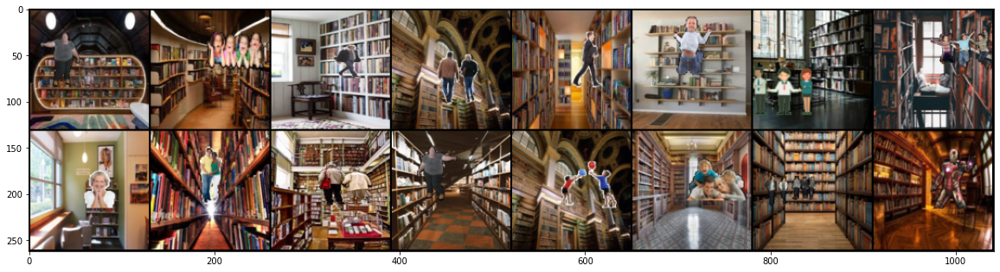

In [0]:
imgs = sample["f2_image"].resize_(16,3,128,128)
utils.show(imgs, False)

#Display Mask Images from batch

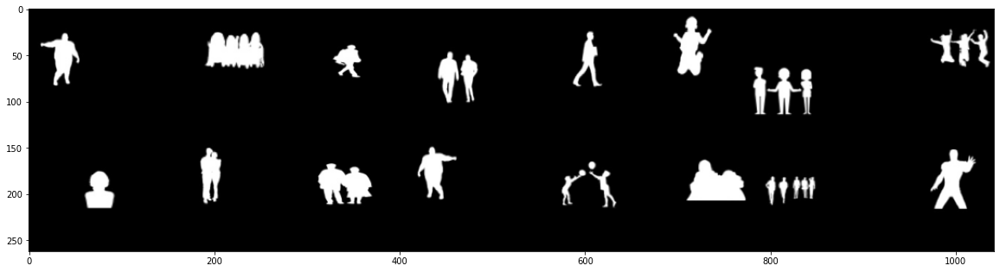

In [0]:
imgs = sample["f3_image"].resize_(16,1,128,128)
utils.show(imgs, False)

#Display Depth Images from batch

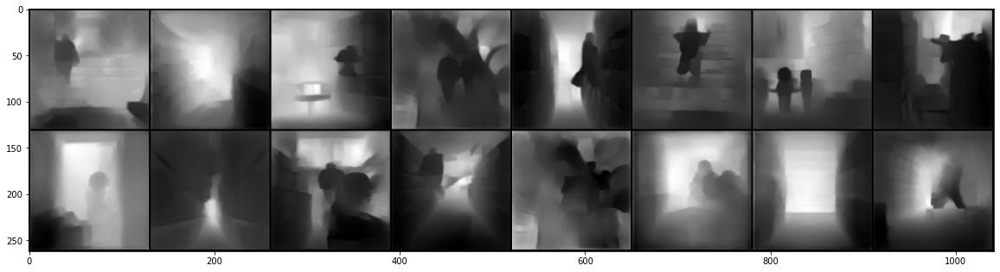

In [0]:
imgs = sample["f4_image"].resize_(16,1,128,128)
utils.show(imgs, False)

#Load & Display Model

In [0]:
device = torch.device("cuda" if cudas.cuda else "cpu")
model = Model.Net().to(device)

In [0]:
from torchsummary import summary
summary(model, (3,128,128))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 32, 128, 128]             864
       BatchNorm2d-2         [-1, 32, 128, 128]              64
              ReLU-3         [-1, 32, 128, 128]               0
            Conv2d-4         [-1, 32, 128, 128]           9,216
       BatchNorm2d-5         [-1, 32, 128, 128]              64
              ReLU-6         [-1, 32, 128, 128]               0
            Conv2d-7         [-1, 64, 128, 128]          18,432
       BatchNorm2d-8         [-1, 64, 128, 128]             128
              ReLU-9         [-1, 64, 128, 128]               0
        MaxPool2d-10           [-1, 64, 64, 64]               0
           Conv2d-11         [-1, 32, 128, 128]             864
      BatchNorm2d-12         [-1, 32, 128, 128]              64
             ReLU-13         [-1, 32, 128, 128]               0
           Conv2d-14         [-1, 32, 1

#Define Loss, Optimizer and scheduler

In [0]:
from torch.optim.lr_scheduler import StepLR
criterion = nn.L1Loss()
optim = torch.optim.SGD(model.parameters(), lr = 0.01, momentum=0.9, weight_decay=1e-5)
scheduler = StepLR(optim, step_size = 1, gamma=0.5)

#Run training and save Model at end of it

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:0  Epoch:12  lOSSf3=0.06666445732116699  lOSSf4=0.06914857029914856 iouf3 0.8602064797716972 iouf4 0.5475953831356204
Batch:100  Epoch:12  lOSSf3=0.06967651844024658  lOSSf4=0.06585279107093811 iouf3 0.8629219679363453 iouf4 0.5367564719056716


KeyboardInterrupt: ignored

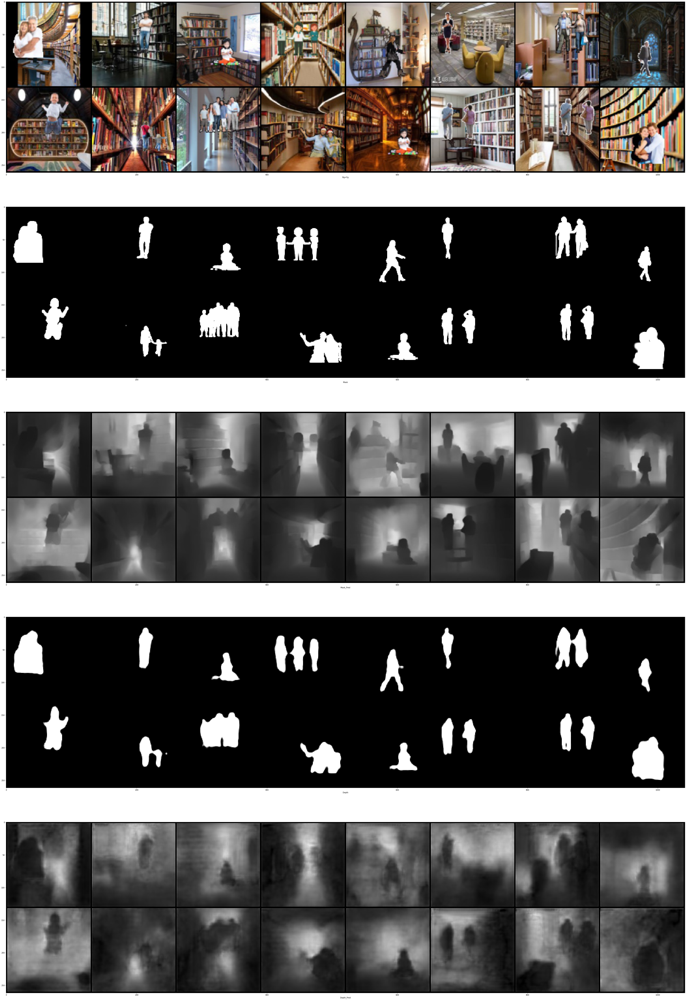

In [0]:
for epoch in range(1,13):
  train(model, criterion, device, train_dl, optim, epoch)
  torch.save(model,'Models_pt/'+str(epoch)+'.pt')
  scheduler.step()

#Using model generated during training, create test output

In [0]:
for i in range(1,13):
   model = torch.load("Models/"+str(i)+".pt")
   test(model, criterion, device, val_dl, i)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:0  Epoch:6  lOSSf3=0.06534700840711594  lOSSf4=0.10378603637218475 iouf3 0.8796885498596894 iouf4 0.46018725304930425
Batch:100  Epoch:6  lOSSf3=0.07485491782426834  lOSSf4=0.08492665737867355 iouf3 0.8385475309634872 iouf4 0.5348508098891731
Batch:200  Epoch:6  lOSSf3=0.06576831638813019  lOSSf4=0.08725203573703766 iouf3 0.9019658561821003 iouf4 0.6032443393038188
Batch:300  Epoch:6  lOSSf3=0.06289888173341751  lOSSf4=0.08647856116294861 iouf3 0.8634924602182787 iouf4 0.5382146028276757
Batch:400  Epoch:6  lOSSf3=0.056274302303791046  lOSSf4=0.10544991493225098 iouf3 0.89395070948469 iouf4 0.5018026876433956


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:500  Epoch:6  lOSSf3=0.06570843607187271  lOSSf4=0.10757476091384888 iouf3 0.9065548329884717 iouf4 0.5025741749248579
Batch:600  Epoch:6  lOSSf3=0.06297081708908081  lOSSf4=0.08491982519626617 iouf3 0.8736284211833879 iouf4 0.567533683260339
Batch:700  Epoch:6  lOSSf3=0.06136627867817879  lOSSf4=0.11937052756547928 iouf3 0.8684297932408869 iouf4 0.4199661523929471
Batch:800  Epoch:6  lOSSf3=0.06319127231836319  lOSSf4=0.09248436242341995 iouf3 0.8940546077774714 iouf4 0.5423900377820412
Batch:900  Epoch:6  lOSSf3=0.051801975816488266  lOSSf4=0.0877358689904213 iouf3 0.8825377755186914 iouf4 0.5430437336903803


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:1000  Epoch:6  lOSSf3=0.06689576804637909  lOSSf4=0.12981770932674408 iouf3 0.8613557239402007 iouf4 0.3944739100772464
Batch:1100  Epoch:6  lOSSf3=0.05870123207569122  lOSSf4=0.08271268010139465 iouf3 0.8514086497691511 iouf4 0.6139442432836199
Batch:1200  Epoch:6  lOSSf3=0.07294294983148575  lOSSf4=0.07943025231361389 iouf3 0.8844224895358045 iouf4 0.6568403016726824
Batch:1300  Epoch:6  lOSSf3=0.06581327319145203  lOSSf4=0.0782807469367981 iouf3 0.8379714710772731 iouf4 0.6486457695278169
Batch:1400  Epoch:6  lOSSf3=0.05135677009820938  lOSSf4=0.08316587656736374 iouf3 0.8866092690969042 iouf4 0.6205381929450086


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:1500  Epoch:6  lOSSf3=0.05513150990009308  lOSSf4=0.08479740470647812 iouf3 0.9013325535736664 iouf4 0.5721958671705395
Batch:1600  Epoch:6  lOSSf3=0.0654030591249466  lOSSf4=0.09054574370384216 iouf3 0.8840108188624515 iouf4 0.548007877230481
Batch:1700  Epoch:6  lOSSf3=0.08167192339897156  lOSSf4=0.10004831850528717 iouf3 0.9055896847363802 iouf4 0.5342922215615218
Batch:1800  Epoch:6  lOSSf3=0.05654888600111008  lOSSf4=0.08575786650180817 iouf3 0.8863960575800804 iouf4 0.5244525046862856
Batch:1900  Epoch:6  lOSSf3=0.06279037892818451  lOSSf4=0.08643381297588348 iouf3 0.8929943595193329 iouf4 0.6380770429386339


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:2000  Epoch:6  lOSSf3=0.0635501965880394  lOSSf4=0.10134970396757126 iouf3 0.8809166040570999 iouf4 0.5404872805446077
Batch:2100  Epoch:6  lOSSf3=0.07161050289869308  lOSSf4=0.08434058725833893 iouf3 0.8992294430174871 iouf4 0.5913666926706044
Batch:2200  Epoch:6  lOSSf3=0.06053585559129715  lOSSf4=0.0834595263004303 iouf3 0.8572474377745242 iouf4 0.6694071409724055
Batch:2300  Epoch:6  lOSSf3=0.06391836702823639  lOSSf4=0.08458968997001648 iouf3 0.8947067566022636 iouf4 0.5592780499183578
Batch:2400  Epoch:6  lOSSf3=0.06948037445545197  lOSSf4=0.09452511370182037 iouf3 0.8691972011135355 iouf4 0.4183771366799541


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:2500  Epoch:6  lOSSf3=0.06671251356601715  lOSSf4=0.08629254996776581 iouf3 0.8811767044325184 iouf4 0.5763401775387896
Batch:2600  Epoch:6  lOSSf3=0.06914667040109634  lOSSf4=0.08433499932289124 iouf3 0.878652297397191 iouf4 0.633425682422265
Batch:2700  Epoch:6  lOSSf3=0.06740361452102661  lOSSf4=0.10162078589200974 iouf3 0.882810676211968 iouf4 0.5152124288780621
Batch:2800  Epoch:6  lOSSf3=0.07861049473285675  lOSSf4=0.09015434980392456 iouf3 0.899536716156568 iouf4 0.5130189405275984
Batch:2900  Epoch:6  lOSSf3=0.05576923489570618  lOSSf4=0.08231720328330994 iouf3 0.8824144693833079 iouf4 0.5829583975346687


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:3000  Epoch:6  lOSSf3=0.06263169646263123  lOSSf4=0.07748742401599884 iouf3 0.8704209046555859 iouf4 0.6496394025361452
Batch:3100  Epoch:6  lOSSf3=0.07170166075229645  lOSSf4=0.08352939784526825 iouf3 0.9019881284416792 iouf4 0.5420922432502163
Batch:3200  Epoch:6  lOSSf3=0.058881551027297974  lOSSf4=0.10237855464220047 iouf3 0.8976785569845507 iouf4 0.5676803515810057
Batch:3300  Epoch:6  lOSSf3=0.07634223252534866  lOSSf4=0.06979335844516754 iouf3 0.8784756119608056 iouf4 0.5369324985459646
Batch:3400  Epoch:6  lOSSf3=0.06106330081820488  lOSSf4=0.10352936387062073 iouf3 0.8842992023441315 iouf4 0.48514863300595484


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:3500  Epoch:6  lOSSf3=0.08417579531669617  lOSSf4=0.10839740931987762 iouf3 0.8892948116369487 iouf4 0.5154708941663011
Batch:3600  Epoch:6  lOSSf3=0.06361566483974457  lOSSf4=0.090240478515625 iouf3 0.8796006735626654 iouf4 0.6408040980646542
Batch:3700  Epoch:6  lOSSf3=0.05830207094550133  lOSSf4=0.11456597596406937 iouf3 0.8736027141055196 iouf4 0.4670199084315037
Batch:3800  Epoch:6  lOSSf3=0.06881489604711533  lOSSf4=0.09646180272102356 iouf3 0.8966012627121848 iouf4 0.5480023763552652
Batch:3900  Epoch:6  lOSSf3=0.05837202072143555  lOSSf4=0.1110425665974617 iouf3 0.905150351887396 iouf4 0.5553502208600019


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:4000  Epoch:6  lOSSf3=0.06312797963619232  lOSSf4=0.09487554430961609 iouf3 0.8464133522727273 iouf4 0.5519474088196697
Batch:4100  Epoch:6  lOSSf3=0.0595712885260582  lOSSf4=0.08387599140405655 iouf3 0.8697783550509071 iouf4 0.5760964483545129
Batch:4200  Epoch:6  lOSSf3=0.05653262138366699  lOSSf4=0.08644101023674011 iouf3 0.8679550561797753 iouf4 0.5488770693265017
Batch:4300  Epoch:6  lOSSf3=0.06514310836791992  lOSSf4=0.08368225395679474 iouf3 0.8333754357601172 iouf4 0.657087935359854
Batch:4400  Epoch:6  lOSSf3=0.07621557265520096  lOSSf4=0.11290144920349121 iouf3 0.8939864279526423 iouf4 0.4061772223800057


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:4500  Epoch:6  lOSSf3=0.05875468999147415  lOSSf4=0.10925468802452087 iouf3 0.8952208970267093 iouf4 0.48228717416874295
Batch:4600  Epoch:6  lOSSf3=0.06876426935195923  lOSSf4=0.08477077633142471 iouf3 0.8418074324324324 iouf4 0.5191872117844515
Batch:4700  Epoch:6  lOSSf3=0.06769426167011261  lOSSf4=0.08649633824825287 iouf3 0.8902448098816876 iouf4 0.58518379292753
Batch:4800  Epoch:6  lOSSf3=0.06042877212166786  lOSSf4=0.09358471632003784 iouf3 0.8801050292870127 iouf4 0.5536273194723899
Batch:4900  Epoch:6  lOSSf3=0.05480669438838959  lOSSf4=0.09884189069271088 iouf3 0.8792555020632737 iouf4 0.5854179714843606


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:5000  Epoch:6  lOSSf3=0.06720499694347382  lOSSf4=0.113474041223526 iouf3 0.8984887688903889 iouf4 0.5381830890980352
Batch:5100  Epoch:6  lOSSf3=0.0731721967458725  lOSSf4=0.07986128330230713 iouf3 0.8613166970201883 iouf4 0.5420480780097189
Batch:5200  Epoch:6  lOSSf3=0.06283774971961975  lOSSf4=0.0990230143070221 iouf3 0.9063371120609552 iouf4 0.4747871456010091
Batch:5300  Epoch:6  lOSSf3=0.06305308640003204  lOSSf4=0.09390290081501007 iouf3 0.8775771598562162 iouf4 0.5650318297432065
Batch:5400  Epoch:6  lOSSf3=0.06094122678041458  lOSSf4=0.11063386499881744 iouf3 0.8903536977491961 iouf4 0.4765041092752212


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:5500  Epoch:6  lOSSf3=0.06377405673265457  lOSSf4=0.07966426759958267 iouf3 0.8691384066201525 iouf4 0.5905338187785242
Batch:5600  Epoch:6  lOSSf3=0.06728667765855789  lOSSf4=0.08016412705183029 iouf3 0.8794146727308682 iouf4 0.593718542379706
Batch:5700  Epoch:6  lOSSf3=0.07400807738304138  lOSSf4=0.09239675104618073 iouf3 0.8968477241578302 iouf4 0.6188492854963982
Batch:5800  Epoch:6  lOSSf3=0.07038378715515137  lOSSf4=0.08464319258928299 iouf3 0.9222419297623271 iouf4 0.5268943063179421
Batch:5900  Epoch:6  lOSSf3=0.060350850224494934  lOSSf4=0.09324213862419128 iouf3 0.8475221750867721 iouf4 0.5323965651834505


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:6000  Epoch:6  lOSSf3=0.06378544867038727  lOSSf4=0.08084450662136078 iouf3 0.8948585312328552 iouf4 0.5762754555873204
Batch:6100  Epoch:6  lOSSf3=0.054771967232227325  lOSSf4=0.0908273383975029 iouf3 0.8896657871591909 iouf4 0.5843214587548339
Batch:6200  Epoch:6  lOSSf3=0.07721741497516632  lOSSf4=0.08799707889556885 iouf3 0.8869192079068622 iouf4 0.5330020189470415
Batch:6300  Epoch:6  lOSSf3=0.0634186640381813  lOSSf4=0.0928359180688858 iouf3 0.8913477732952098 iouf4 0.5627235314291313
Batch:6400  Epoch:6  lOSSf3=0.06285957992076874  lOSSf4=0.06429541110992432 iouf3 0.8667992047713717 iouf4 0.6178964748881871


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:6500  Epoch:6  lOSSf3=0.06607819348573685  lOSSf4=0.08771003782749176 iouf3 0.8639532998216313 iouf4 0.47661604821555187
Batch:6600  Epoch:6  lOSSf3=0.06794175505638123  lOSSf4=0.1020900309085846 iouf3 0.86499349170192 iouf4 0.5271533277583748
Batch:6700  Epoch:6  lOSSf3=0.06336405873298645  lOSSf4=0.08774144947528839 iouf3 0.9031311532373267 iouf4 0.5675159068890576
Batch:6800  Epoch:6  lOSSf3=0.06774076819419861  lOSSf4=0.0744713544845581 iouf3 0.8792563676419434 iouf4 0.6500548095368595
Batch:6900  Epoch:6  lOSSf3=0.06948039680719376  lOSSf4=0.09170308709144592 iouf3 0.8561896818777552 iouf4 0.5562457679512468


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:7000  Epoch:6  lOSSf3=0.06408829987049103  lOSSf4=0.1311449408531189 iouf3 0.88124 iouf4 0.4020198530831208
Batch:7100  Epoch:6  lOSSf3=0.06749648600816727  lOSSf4=0.07308714091777802 iouf3 0.8801117019241804 iouf4 0.612018056686154
Batch:7200  Epoch:6  lOSSf3=0.05821642652153969  lOSSf4=0.11120891571044922 iouf3 0.8823376059091896 iouf4 0.5729255134630797
Batch:7300  Epoch:6  lOSSf3=0.059542976319789886  lOSSf4=0.10198338329792023 iouf3 0.8594856823938523 iouf4 0.5710021536795173
Batch:7400  Epoch:6  lOSSf3=0.05740473419427872  lOSSf4=0.08162488788366318 iouf3 0.8874529270797672 iouf4 0.5613090673116631



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:0  Epoch:7  lOSSf3=0.059147439897060394  lOSSf4=0.0688837319612503 iouf3 0.8744550264550265 iouf4 0.5531908006538592
Batch:100  Epoch:7  lOSSf3=0.0686069130897522  lOSSf4=0.0848553329706192 iouf3 0.8829115165783794 iouf4 0.5396303536520348
Batch:200  Epoch:7  lOSSf3=0.07466471195220947  lOSSf4=0.10067955404520035 iouf3 0.8901329601119664 iouf4 0.5007235552236019
Batch:300  Epoch:7  lOSSf3=0.050309982150793076  lOSSf4=0.07832477986812592 iouf3 0.8970894874022589 iouf4 0.6277372262773723
Batch:400  Epoch:7  lOSSf3=0.0678718313574791  lOSSf4=0.10449884831905365 iouf3 0.8882497945768283 iouf4 0.4918918918918919


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:500  Epoch:7  lOSSf3=0.074449822306633  lOSSf4=0.08109842240810394 iouf3 0.8942452222460812 iouf4 0.6175352026280994
Batch:600  Epoch:7  lOSSf3=0.06094178929924965  lOSSf4=0.09091322124004364 iouf3 0.8385709711358126 iouf4 0.6102143827828161
Batch:700  Epoch:7  lOSSf3=0.062471143901348114  lOSSf4=0.09151338040828705 iouf3 0.8781312927909787 iouf4 0.5475847106119583
Batch:800  Epoch:7  lOSSf3=0.06958253681659698  lOSSf4=0.12321025133132935 iouf3 0.8711619278385644 iouf4 0.4367680217158118
Batch:900  Epoch:7  lOSSf3=0.06619074195623398  lOSSf4=0.0799785703420639 iouf3 0.9081998114985862 iouf4 0.4224948365501033


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:1000  Epoch:7  lOSSf3=0.06453394889831543  lOSSf4=0.07438619434833527 iouf3 0.8825830074061746 iouf4 0.5363618919696824
Batch:1100  Epoch:7  lOSSf3=0.06131741404533386  lOSSf4=0.09483739733695984 iouf3 0.891458273646298 iouf4 0.5375983142626124
Batch:1200  Epoch:7  lOSSf3=0.06827955693006516  lOSSf4=0.09053130447864532 iouf3 0.8930300641819615 iouf4 0.6017866984529806
Batch:1300  Epoch:7  lOSSf3=0.06106666848063469  lOSSf4=0.08700404316186905 iouf3 0.8863108085671593 iouf4 0.499757295414311
Batch:1400  Epoch:7  lOSSf3=0.06981834769248962  lOSSf4=0.08793872594833374 iouf3 0.8705900965037178 iouf4 0.5673998007510154


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:1500  Epoch:7  lOSSf3=0.06329910457134247  lOSSf4=0.08837193250656128 iouf3 0.8602412786899525 iouf4 0.616959461965458
Batch:1600  Epoch:7  lOSSf3=0.060273025184869766  lOSSf4=0.09066975116729736 iouf3 0.9107210554249754 iouf4 0.5415777296813195
Batch:1700  Epoch:7  lOSSf3=0.055553045123815536  lOSSf4=0.10115884244441986 iouf3 0.8903292181069958 iouf4 0.5191286312028678
Batch:1800  Epoch:7  lOSSf3=0.06693049520254135  lOSSf4=0.08124339580535889 iouf3 0.8540502210728289 iouf4 0.5046895699019694
Batch:1900  Epoch:7  lOSSf3=0.06416767835617065  lOSSf4=0.06609092652797699 iouf3 0.8715899148970015 iouf4 0.6503244287982329


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:2000  Epoch:7  lOSSf3=0.055884089320898056  lOSSf4=0.0791788324713707 iouf3 0.8895322005454164 iouf4 0.6012381539183758
Batch:2100  Epoch:7  lOSSf3=0.0666854977607727  lOSSf4=0.12352478504180908 iouf3 0.883423627080329 iouf4 0.5136988516901181
Batch:2200  Epoch:7  lOSSf3=0.06416739523410797  lOSSf4=0.09031110256910324 iouf3 0.8549780890363271 iouf4 0.5010638759824569
Batch:2300  Epoch:7  lOSSf3=0.06298333406448364  lOSSf4=0.08689473569393158 iouf3 0.8761316224513894 iouf4 0.5091908388318239
Batch:2400  Epoch:7  lOSSf3=0.06225226819515228  lOSSf4=0.10286756604909897 iouf3 0.9012913702443551 iouf4 0.531582665756607


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:2500  Epoch:7  lOSSf3=0.08088541775941849  lOSSf4=0.09958809614181519 iouf3 0.8791248206599713 iouf4 0.5676333908189729
Batch:2600  Epoch:7  lOSSf3=0.05563841760158539  lOSSf4=0.07950493693351746 iouf3 0.8894270234772615 iouf4 0.5625988486113747
Batch:2700  Epoch:7  lOSSf3=0.05302304029464722  lOSSf4=0.09092817455530167 iouf3 0.8949536113760513 iouf4 0.5391276964257598
Batch:2800  Epoch:7  lOSSf3=0.06840942800045013  lOSSf4=0.07268264889717102 iouf3 0.8694582274395901 iouf4 0.6789660462737683
Batch:2900  Epoch:7  lOSSf3=0.058310188353061676  lOSSf4=0.08221675455570221 iouf3 0.8746808335392472 iouf4 0.5248966042664345


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:3000  Epoch:7  lOSSf3=0.06365024298429489  lOSSf4=0.09285905957221985 iouf3 0.8859394277072472 iouf4 0.48074140425825124
Batch:3100  Epoch:7  lOSSf3=0.06405368447303772  lOSSf4=0.08438804745674133 iouf3 0.8715761301384184 iouf4 0.5489117908531165
Batch:3200  Epoch:7  lOSSf3=0.07453703880310059  lOSSf4=0.1019386276602745 iouf3 0.9116549149730402 iouf4 0.5353211810610914
Batch:3300  Epoch:7  lOSSf3=0.07462966442108154  lOSSf4=0.0960802286863327 iouf3 0.8853498488534984 iouf4 0.5536149152897432
Batch:3400  Epoch:7  lOSSf3=0.07617780566215515  lOSSf4=0.07765960693359375 iouf3 0.8930335968379447 iouf4 0.5882266174991619


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:3500  Epoch:7  lOSSf3=0.06710316240787506  lOSSf4=0.06772346794605255 iouf3 0.8909800587416912 iouf4 0.6029714102152265
Batch:3600  Epoch:7  lOSSf3=0.06650403141975403  lOSSf4=0.08903083950281143 iouf3 0.8913886436057895 iouf4 0.5965202631020582
Batch:3700  Epoch:7  lOSSf3=0.05901726335287094  lOSSf4=0.08690589666366577 iouf3 0.8843646864686469 iouf4 0.6423059878522458
Batch:3800  Epoch:7  lOSSf3=0.054159052670001984  lOSSf4=0.10648677498102188 iouf3 0.8999879212465274 iouf4 0.4981975022531222
Batch:3900  Epoch:7  lOSSf3=0.06732828915119171  lOSSf4=0.08511090278625488 iouf3 0.9066035557607943 iouf4 0.6133530501119434


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:4000  Epoch:7  lOSSf3=0.05919138714671135  lOSSf4=0.10014645755290985 iouf3 0.865157087783046 iouf4 0.5067533573280699
Batch:4100  Epoch:7  lOSSf3=0.06351462751626968  lOSSf4=0.08383975178003311 iouf3 0.8894628099173554 iouf4 0.5906878223344911
Batch:4200  Epoch:7  lOSSf3=0.06493297964334488  lOSSf4=0.07406459748744965 iouf3 0.8638296165570352 iouf4 0.5709261607196764
Batch:4300  Epoch:7  lOSSf3=0.06860434263944626  lOSSf4=0.09024260938167572 iouf3 0.8459547465976455 iouf4 0.5474692101575752
Batch:4400  Epoch:7  lOSSf3=0.06749146431684494  lOSSf4=0.06276039779186249 iouf3 0.8897569770499193 iouf4 0.6783896184576093


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:4500  Epoch:7  lOSSf3=0.055008530616760254  lOSSf4=0.09281426668167114 iouf3 0.8645483431684067 iouf4 0.5701958635803315
Batch:4600  Epoch:7  lOSSf3=0.0678510069847107  lOSSf4=0.08582527935504913 iouf3 0.8748918089542843 iouf4 0.5618433650347865
Batch:4700  Epoch:7  lOSSf3=0.06197289377450943  lOSSf4=0.10092517733573914 iouf3 0.8503631297675056 iouf4 0.5380187127564915
Batch:4800  Epoch:7  lOSSf3=0.08024284988641739  lOSSf4=0.10996571183204651 iouf3 0.8892478237214363 iouf4 0.5207446259081153
Batch:4900  Epoch:7  lOSSf3=0.07658456265926361  lOSSf4=0.0837404876947403 iouf3 0.8727190977556296 iouf4 0.6290277055633959


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:5000  Epoch:7  lOSSf3=0.07327130436897278  lOSSf4=0.11457479745149612 iouf3 0.8945250489164543 iouf4 0.42958058397973903
Batch:5100  Epoch:7  lOSSf3=0.06701383739709854  lOSSf4=0.08491044491529465 iouf3 0.871140306022106 iouf4 0.6148427672955975
Batch:5200  Epoch:7  lOSSf3=0.06753002852201462  lOSSf4=0.09044993668794632 iouf3 0.8769499417927823 iouf4 0.5272767601769808
Batch:5300  Epoch:7  lOSSf3=0.05677160620689392  lOSSf4=0.09814658761024475 iouf3 0.8700745941202281 iouf4 0.5392227380718847
Batch:5400  Epoch:7  lOSSf3=0.07256007194519043  lOSSf4=0.0895732045173645 iouf3 0.9033654720756776 iouf4 0.6018565941101153


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:5500  Epoch:7  lOSSf3=0.06879132986068726  lOSSf4=0.0748436450958252 iouf3 0.8957502820609251 iouf4 0.5493505134605898
Batch:5600  Epoch:7  lOSSf3=0.06234677881002426  lOSSf4=0.08861648291349411 iouf3 0.8539832698287566 iouf4 0.5821920345785736
Batch:5700  Epoch:7  lOSSf3=0.05773157626390457  lOSSf4=0.07717293500900269 iouf3 0.8921960368588436 iouf4 0.5619058970767902
Batch:5800  Epoch:7  lOSSf3=0.07186770439147949  lOSSf4=0.12276226282119751 iouf3 0.8929323745187768 iouf4 0.48565291914425374
Batch:5900  Epoch:7  lOSSf3=0.05186127498745918  lOSSf4=0.0652887374162674 iouf3 0.8931149478660982 iouf4 0.6381476935004523


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:6000  Epoch:7  lOSSf3=0.0752556174993515  lOSSf4=0.07603517919778824 iouf3 0.8844701019171833 iouf4 0.5437600845713014
Batch:6100  Epoch:7  lOSSf3=0.06188540533185005  lOSSf4=0.08999013900756836 iouf3 0.8709785804283914 iouf4 0.624861281051703
Batch:6200  Epoch:7  lOSSf3=0.06423082202672958  lOSSf4=0.08814288675785065 iouf3 0.869120827855295 iouf4 0.5594687033893947
Batch:6300  Epoch:7  lOSSf3=0.06699156761169434  lOSSf4=0.09198740124702454 iouf3 0.8588446748035445 iouf4 0.5277874141400125
Batch:6400  Epoch:7  lOSSf3=0.06390628218650818  lOSSf4=0.09310562908649445 iouf3 0.8579133586468761 iouf4 0.572447514803517


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:6500  Epoch:7  lOSSf3=0.06716720014810562  lOSSf4=0.0873628556728363 iouf3 0.8700801389601673 iouf4 0.5081154647489751
Batch:6600  Epoch:7  lOSSf3=0.07217320799827576  lOSSf4=0.09733995795249939 iouf3 0.8435533621221468 iouf4 0.5533647821920837
Batch:6700  Epoch:7  lOSSf3=0.0625542402267456  lOSSf4=0.06728674471378326 iouf3 0.8457852623743952 iouf4 0.6427874500716529
Batch:6800  Epoch:7  lOSSf3=0.06711134314537048  lOSSf4=0.10057589411735535 iouf3 0.8506375227686703 iouf4 0.6070592228067199
Batch:6900  Epoch:7  lOSSf3=0.08297938108444214  lOSSf4=0.07987728714942932 iouf3 0.9115927186230136 iouf4 0.6696397810358687


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:7000  Epoch:7  lOSSf3=0.07616633176803589  lOSSf4=0.09037003666162491 iouf3 0.8869491400310032 iouf4 0.47688947863106096
Batch:7100  Epoch:7  lOSSf3=0.06676910072565079  lOSSf4=0.11198142170906067 iouf3 0.8764110322355405 iouf4 0.5056293579546666
Batch:7200  Epoch:7  lOSSf3=0.07127010822296143  lOSSf4=0.09566625952720642 iouf3 0.895095612241237 iouf4 0.5679384122204143
Batch:7300  Epoch:7  lOSSf3=0.06543256342411041  lOSSf4=0.11235307157039642 iouf3 0.8919071660010549 iouf4 0.461829287557264
Batch:7400  Epoch:7  lOSSf3=0.06860169768333435  lOSSf4=0.07233080267906189 iouf3 0.9008236488773553 iouf4 0.640224683488581



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:0  Epoch:8  lOSSf3=0.07084736973047256  lOSSf4=0.0640830472111702 iouf3 0.865278050697583 iouf4 0.647609841827768
Batch:100  Epoch:8  lOSSf3=0.06511767953634262  lOSSf4=0.07379963994026184 iouf3 0.863166170142337 iouf4 0.605875581073401
Batch:200  Epoch:8  lOSSf3=0.055977992713451385  lOSSf4=0.08889077603816986 iouf3 0.8842405413457037 iouf4 0.505449240538917
Batch:300  Epoch:8  lOSSf3=0.06290572881698608  lOSSf4=0.0984017625451088 iouf3 0.9068033194386018 iouf4 0.5469156698479526
Batch:400  Epoch:8  lOSSf3=0.05946238338947296  lOSSf4=0.07633589953184128 iouf3 0.8707983645362599 iouf4 0.6145765998707176


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:500  Epoch:8  lOSSf3=0.06364654004573822  lOSSf4=0.09264466166496277 iouf3 0.8855194830935109 iouf4 0.5567795737671163
Batch:600  Epoch:8  lOSSf3=0.05364132672548294  lOSSf4=0.10315443575382233 iouf3 0.888334864191051 iouf4 0.4879385110747579
Batch:700  Epoch:8  lOSSf3=0.06430058926343918  lOSSf4=0.08622223138809204 iouf3 0.8908920992173202 iouf4 0.5533270807782026
Batch:800  Epoch:8  lOSSf3=0.055989451706409454  lOSSf4=0.10093492269515991 iouf3 0.8853152229625832 iouf4 0.48610250353722567
Batch:900  Epoch:8  lOSSf3=0.06890812516212463  lOSSf4=0.11390889436006546 iouf3 0.8785374600452172 iouf4 0.5067568373468828


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:1000  Epoch:8  lOSSf3=0.07170571386814117  lOSSf4=0.081986203789711 iouf3 0.8937205243417876 iouf4 0.5941419405964736
Batch:1100  Epoch:8  lOSSf3=0.05971503630280495  lOSSf4=0.09912045300006866 iouf3 0.8968132910087809 iouf4 0.5115789179989397
Batch:1200  Epoch:8  lOSSf3=0.07310682535171509  lOSSf4=0.09900800883769989 iouf3 0.8599412719264353 iouf4 0.5439856373429084
Batch:1300  Epoch:8  lOSSf3=0.06365200877189636  lOSSf4=0.08307461440563202 iouf3 0.8819544481214717 iouf4 0.5732993459292147
Batch:1400  Epoch:8  lOSSf3=0.07382557541131973  lOSSf4=0.09060491621494293 iouf3 0.8813768821634579 iouf4 0.5468456304767956


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:1500  Epoch:8  lOSSf3=0.05911591649055481  lOSSf4=0.09470659494400024 iouf3 0.8937625424908875 iouf4 0.5362723592863119
Batch:1600  Epoch:8  lOSSf3=0.05936944857239723  lOSSf4=0.12761059403419495 iouf3 0.8761570106273568 iouf4 0.4877455440518719
Batch:1700  Epoch:8  lOSSf3=0.05756668001413345  lOSSf4=0.07713648676872253 iouf3 0.8808117133316209 iouf4 0.590425258394611
Batch:1800  Epoch:8  lOSSf3=0.0649842768907547  lOSSf4=0.07345445454120636 iouf3 0.8607299270072992 iouf4 0.5302163976454317
Batch:1900  Epoch:8  lOSSf3=0.06878593564033508  lOSSf4=0.07361897826194763 iouf3 0.8656500802568218 iouf4 0.6566622691292876


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:2000  Epoch:8  lOSSf3=0.06599746644496918  lOSSf4=0.07973536849021912 iouf3 0.9036731634182908 iouf4 0.573449245048696
Batch:2100  Epoch:8  lOSSf3=0.054950982332229614  lOSSf4=0.08980020135641098 iouf3 0.8711588300629397 iouf4 0.5375722543352601
Batch:2200  Epoch:8  lOSSf3=0.06924991309642792  lOSSf4=0.07364116609096527 iouf3 0.8745983197181463 iouf4 0.6085225942402248
Batch:2300  Epoch:8  lOSSf3=0.06239316612482071  lOSSf4=0.09424697607755661 iouf3 0.9007246941478999 iouf4 0.6123692820940527
Batch:2400  Epoch:8  lOSSf3=0.06777872890233994  lOSSf4=0.1018870621919632 iouf3 0.8722529086849219 iouf4 0.4543335575295127


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:2500  Epoch:8  lOSSf3=0.0626416802406311  lOSSf4=0.10021156072616577 iouf3 0.8818669314796425 iouf4 0.5030529038696377
Batch:2600  Epoch:8  lOSSf3=0.06089567765593529  lOSSf4=0.0925043374300003 iouf3 0.8966103706047542 iouf4 0.6467287064005115
Batch:2700  Epoch:8  lOSSf3=0.06261061877012253  lOSSf4=0.08809790760278702 iouf3 0.8914820518895865 iouf4 0.5308297199970603
Batch:2800  Epoch:8  lOSSf3=0.06344854086637497  lOSSf4=0.10733884572982788 iouf3 0.8903456495828367 iouf4 0.4287403279993445
Batch:2900  Epoch:8  lOSSf3=0.062128663063049316  lOSSf4=0.1242121234536171 iouf3 0.8292318085311716 iouf4 0.4550076582709326


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:3000  Epoch:8  lOSSf3=0.06374946236610413  lOSSf4=0.09436827152967453 iouf3 0.8922837706511176 iouf4 0.48656255920322605
Batch:3100  Epoch:8  lOSSf3=0.05753198266029358  lOSSf4=0.10694006830453873 iouf3 0.8918754560934079 iouf4 0.5227616091819406
Batch:3200  Epoch:8  lOSSf3=0.05952386185526848  lOSSf4=0.07638475298881531 iouf3 0.8720773759461733 iouf4 0.48978877552806116
Batch:3300  Epoch:8  lOSSf3=0.06281871348619461  lOSSf4=0.07162800431251526 iouf3 0.8757559767828875 iouf4 0.7031490649064907
Batch:3400  Epoch:8  lOSSf3=0.06678878515958786  lOSSf4=0.07767113298177719 iouf3 0.8375329558715477 iouf4 0.6047501774011771


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:3500  Epoch:8  lOSSf3=0.06703045964241028  lOSSf4=0.11963598430156708 iouf3 0.879800796812749 iouf4 0.4946186942695018
Batch:3600  Epoch:8  lOSSf3=0.05234859138727188  lOSSf4=0.08643457293510437 iouf3 0.8801711840228246 iouf4 0.49814013211018887
Batch:3700  Epoch:8  lOSSf3=0.07151369750499725  lOSSf4=0.07505341619253159 iouf3 0.9066604296354935 iouf4 0.6345646852049464
Batch:3800  Epoch:8  lOSSf3=0.06408995389938354  lOSSf4=0.07441794872283936 iouf3 0.8685191460521857 iouf4 0.647318194702529
Batch:3900  Epoch:8  lOSSf3=0.06533589959144592  lOSSf4=0.0962291955947876 iouf3 0.8804303858911091 iouf4 0.5234972677595628


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:4000  Epoch:8  lOSSf3=0.06887252628803253  lOSSf4=0.09671667218208313 iouf3 0.8604068857589985 iouf4 0.49919883466860887
Batch:4100  Epoch:8  lOSSf3=0.05649791657924652  lOSSf4=0.07796675711870193 iouf3 0.8815587734241908 iouf4 0.5840472402398728
Batch:4200  Epoch:8  lOSSf3=0.0653243213891983  lOSSf4=0.09512835741043091 iouf3 0.8981804103755323 iouf4 0.5137970955025718
Batch:4300  Epoch:8  lOSSf3=0.06891457736492157  lOSSf4=0.08429832011461258 iouf3 0.8973578744248182 iouf4 0.6268167800386596
Batch:4400  Epoch:8  lOSSf3=0.05601438134908676  lOSSf4=0.08474688977003098 iouf3 0.8895120353692484 iouf4 0.6092417429058768


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:4500  Epoch:8  lOSSf3=0.05964677408337593  lOSSf4=0.08202803879976273 iouf3 0.8876043405676127 iouf4 0.6103539874112144
Batch:4600  Epoch:8  lOSSf3=0.07343751937150955  lOSSf4=0.08016207814216614 iouf3 0.890305109225492 iouf4 0.6094471965944038
Batch:4700  Epoch:8  lOSSf3=0.06309716403484344  lOSSf4=0.09522999823093414 iouf3 0.8531454847862244 iouf4 0.5624032603910766
Batch:4800  Epoch:8  lOSSf3=0.0660400539636612  lOSSf4=0.10616758465766907 iouf3 0.8859776621787026 iouf4 0.49340347007169216
Batch:4900  Epoch:8  lOSSf3=0.062021151185035706  lOSSf4=0.07031461596488953 iouf3 0.8813442795324948 iouf4 0.63401863771736


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:5000  Epoch:8  lOSSf3=0.06345291435718536  lOSSf4=0.09047643840312958 iouf3 0.8462365109927014 iouf4 0.575621995828169
Batch:5100  Epoch:8  lOSSf3=0.06241840869188309  lOSSf4=0.0959012359380722 iouf3 0.8786234817813765 iouf4 0.5389850649526021
Batch:5200  Epoch:8  lOSSf3=0.05757121741771698  lOSSf4=0.0961357057094574 iouf3 0.8751351585139051 iouf4 0.4490851446841667
Batch:5300  Epoch:8  lOSSf3=0.07033798098564148  lOSSf4=0.08192464709281921 iouf3 0.8698257293910319 iouf4 0.5929682126529016
Batch:5400  Epoch:8  lOSSf3=0.06203966960310936  lOSSf4=0.08812323957681656 iouf3 0.8599404188206431 iouf4 0.4404697769636893


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:5500  Epoch:8  lOSSf3=0.05944404751062393  lOSSf4=0.09021207690238953 iouf3 0.8752039492950676 iouf4 0.6054032258064516
Batch:5600  Epoch:8  lOSSf3=0.06289223581552505  lOSSf4=0.10923730581998825 iouf3 0.8505356801224412 iouf4 0.4575659210123962
Batch:5700  Epoch:8  lOSSf3=0.05688557028770447  lOSSf4=0.09651290625333786 iouf3 0.8966444080467011 iouf4 0.5982108456944712
Batch:5800  Epoch:8  lOSSf3=0.057327114045619965  lOSSf4=0.09737378358840942 iouf3 0.8743080134313459 iouf4 0.4863731427824496
Batch:5900  Epoch:8  lOSSf3=0.06727281212806702  lOSSf4=0.0652257427573204 iouf3 0.8755369928400955 iouf4 0.5972815783554513


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:6000  Epoch:8  lOSSf3=0.08042597770690918  lOSSf4=0.08457744121551514 iouf3 0.8905172413793103 iouf4 0.5401905692645981
Batch:6100  Epoch:8  lOSSf3=0.061720311641693115  lOSSf4=0.09170502424240112 iouf3 0.87229599933183 iouf4 0.5453039031652535
Batch:6200  Epoch:8  lOSSf3=0.07799612730741501  lOSSf4=0.07771076261997223 iouf3 0.893367508163337 iouf4 0.6258653149891383
Batch:6300  Epoch:8  lOSSf3=0.05849781632423401  lOSSf4=0.08085636794567108 iouf3 0.8621782740348221 iouf4 0.5849793193527321
Batch:6400  Epoch:8  lOSSf3=0.07138146460056305  lOSSf4=0.11969874799251556 iouf3 0.8724974061407217 iouf4 0.413559214087826


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:6500  Epoch:8  lOSSf3=0.054330725222826004  lOSSf4=0.11743118613958359 iouf3 0.8854455888938647 iouf4 0.48799899730525786
Batch:6600  Epoch:8  lOSSf3=0.06311754882335663  lOSSf4=0.07121868431568146 iouf3 0.8569951311991038 iouf4 0.5097158243041588
Batch:6700  Epoch:8  lOSSf3=0.06324110180139542  lOSSf4=0.10732079297304153 iouf3 0.8827212863087303 iouf4 0.43655668425335326
Batch:6800  Epoch:8  lOSSf3=0.08170720934867859  lOSSf4=0.08944321423768997 iouf3 0.8959097610313025 iouf4 0.5446627444353984
Batch:6900  Epoch:8  lOSSf3=0.06173748895525932  lOSSf4=0.07794345170259476 iouf3 0.8752698684264125 iouf4 0.5680590142367148


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:7000  Epoch:8  lOSSf3=0.06889186054468155  lOSSf4=0.08617851883172989 iouf3 0.8857733508738959 iouf4 0.5131354846488915
Batch:7100  Epoch:8  lOSSf3=0.060432299971580505  lOSSf4=0.09093749523162842 iouf3 0.8808061989245035 iouf4 0.5906489306042205
Batch:7200  Epoch:8  lOSSf3=0.055439725518226624  lOSSf4=0.10102830827236176 iouf3 0.8909922228869327 iouf4 0.5159808732855166
Batch:7300  Epoch:8  lOSSf3=0.05663905292749405  lOSSf4=0.08359646797180176 iouf3 0.8770229414903077 iouf4 0.5637194537941603
Batch:7400  Epoch:8  lOSSf3=0.06362107396125793  lOSSf4=0.09019741415977478 iouf3 0.9036512302648931 iouf4 0.5934790064181079



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:0  Epoch:9  lOSSf3=0.05808047577738762  lOSSf4=0.08708222955465317 iouf3 0.8722241349629885 iouf4 0.4954888980022263
Batch:100  Epoch:9  lOSSf3=0.0547739714384079  lOSSf4=0.09223799407482147 iouf3 0.8676951618415272 iouf4 0.5455577632699404
Batch:200  Epoch:9  lOSSf3=0.059896133840084076  lOSSf4=0.08007094264030457 iouf3 0.9032544492915878 iouf4 0.5598138165997537
Batch:300  Epoch:9  lOSSf3=0.07515757530927658  lOSSf4=0.0850355327129364 iouf3 0.8971853580282922 iouf4 0.5526703922709497
Batch:400  Epoch:9  lOSSf3=0.08593514561653137  lOSSf4=0.0906757265329361 iouf3 0.9029320886200776 iouf4 0.5344100949500459


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:500  Epoch:9  lOSSf3=0.06975521892309189  lOSSf4=0.09012314677238464 iouf3 0.8709143407122233 iouf4 0.5335609114090647
Batch:600  Epoch:9  lOSSf3=0.06003627926111221  lOSSf4=0.09550727158784866 iouf3 0.8595510563380282 iouf4 0.55969586449898
Batch:700  Epoch:9  lOSSf3=0.06811629235744476  lOSSf4=0.0921788439154625 iouf3 0.8774430625100953 iouf4 0.4941798645699256
Batch:800  Epoch:9  lOSSf3=0.06464915722608566  lOSSf4=0.09318513423204422 iouf3 0.8691892782146827 iouf4 0.541870003892099
Batch:900  Epoch:9  lOSSf3=0.06936739385128021  lOSSf4=0.07660976052284241 iouf3 0.8716147264306461 iouf4 0.6537511685339956


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:1000  Epoch:9  lOSSf3=0.06256996840238571  lOSSf4=0.1299007534980774 iouf3 0.8942525988768073 iouf4 0.40519877675840976
Batch:1100  Epoch:9  lOSSf3=0.06437356770038605  lOSSf4=0.06338351219892502 iouf3 0.8384325837274395 iouf4 0.6447932176608223
Batch:1200  Epoch:9  lOSSf3=0.07522844523191452  lOSSf4=0.06883411854505539 iouf3 0.8913158358287828 iouf4 0.6088666895189593
Batch:1300  Epoch:9  lOSSf3=0.06205976381897926  lOSSf4=0.08704065531492233 iouf3 0.876787446745687 iouf4 0.6176454892333965
Batch:1400  Epoch:9  lOSSf3=0.06198001652956009  lOSSf4=0.08334513008594513 iouf3 0.873778082661636 iouf4 0.5392625537637988


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:1500  Epoch:9  lOSSf3=0.05636555701494217  lOSSf4=0.07133545726537704 iouf3 0.8883619752012182 iouf4 0.6198054555730731
Batch:1600  Epoch:9  lOSSf3=0.06228677183389664  lOSSf4=0.08737310022115707 iouf3 0.9181652332551472 iouf4 0.6368854504616921
Batch:1700  Epoch:9  lOSSf3=0.07407033443450928  lOSSf4=0.0919431746006012 iouf3 0.8894652250146113 iouf4 0.5605171515533741
Batch:1800  Epoch:9  lOSSf3=0.07054883241653442  lOSSf4=0.07766309380531311 iouf3 0.8736517719568567 iouf4 0.5745839003454413
Batch:1900  Epoch:9  lOSSf3=0.05760727822780609  lOSSf4=0.0819508358836174 iouf3 0.8762135922330098 iouf4 0.5704603176988624


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:2000  Epoch:9  lOSSf3=0.06428635865449905  lOSSf4=0.07745278626680374 iouf3 0.8566297515713858 iouf4 0.557368549469318
Batch:2100  Epoch:9  lOSSf3=0.05937877297401428  lOSSf4=0.11495690792798996 iouf3 0.8666015459101334 iouf4 0.5298619498594666
Batch:2200  Epoch:9  lOSSf3=0.05246937274932861  lOSSf4=0.10048916935920715 iouf3 0.9011437908496732 iouf4 0.5657593264561112
Batch:2300  Epoch:9  lOSSf3=0.06137533858418465  lOSSf4=0.09072327613830566 iouf3 0.8762933531992385 iouf4 0.625088615640355
Batch:2400  Epoch:9  lOSSf3=0.059261471033096313  lOSSf4=0.07014267891645432 iouf3 0.8704181287785905 iouf4 0.6899276918788634


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:2500  Epoch:9  lOSSf3=0.06418316811323166  lOSSf4=0.09490670263767242 iouf3 0.8915170965569159 iouf4 0.5509676949941793
Batch:2600  Epoch:9  lOSSf3=0.06753889471292496  lOSSf4=0.08427953720092773 iouf3 0.8772970458246103 iouf4 0.6347949928790945
Batch:2700  Epoch:9  lOSSf3=0.05975313484668732  lOSSf4=0.09250085055828094 iouf3 0.8670681486073595 iouf4 0.5527759265904547
Batch:2800  Epoch:9  lOSSf3=0.059408072382211685  lOSSf4=0.08214433491230011 iouf3 0.8935669131925794 iouf4 0.5296699650054302
Batch:2900  Epoch:9  lOSSf3=0.06645549833774567  lOSSf4=0.088719941675663 iouf3 0.8398878790452731 iouf4 0.5425115570498004


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:3000  Epoch:9  lOSSf3=0.07629631459712982  lOSSf4=0.08889937400817871 iouf3 0.8814401658979585 iouf4 0.5065413512023903
Batch:3100  Epoch:9  lOSSf3=0.07673710584640503  lOSSf4=0.11669422686100006 iouf3 0.8724067150502163 iouf4 0.4773027090694935
Batch:3200  Epoch:9  lOSSf3=0.07066750526428223  lOSSf4=0.10593768954277039 iouf3 0.8863007991516115 iouf4 0.5443931083141771
Batch:3300  Epoch:9  lOSSf3=0.06442929804325104  lOSSf4=0.10738550871610641 iouf3 0.8706109109192994 iouf4 0.45429125916089985
Batch:3400  Epoch:9  lOSSf3=0.05889070779085159  lOSSf4=0.09855847805738449 iouf3 0.8985489574442141 iouf4 0.49872419705417775


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:3500  Epoch:9  lOSSf3=0.06184583157300949  lOSSf4=0.10438776761293411 iouf3 0.8656447627423881 iouf4 0.5186541273924786
Batch:3600  Epoch:9  lOSSf3=0.07759106159210205  lOSSf4=0.07944545149803162 iouf3 0.8885859687386405 iouf4 0.5998129227226939
Batch:3700  Epoch:9  lOSSf3=0.05504312366247177  lOSSf4=0.10462577641010284 iouf3 0.8844242271080786 iouf4 0.5150030551675978
Batch:3800  Epoch:9  lOSSf3=0.0585177056491375  lOSSf4=0.0810823142528534 iouf3 0.8736156902527686 iouf4 0.5910325110980218
Batch:3900  Epoch:9  lOSSf3=0.07054318487644196  lOSSf4=0.0967346578836441 iouf3 0.8777922775773394 iouf4 0.5019294456443485


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:4000  Epoch:9  lOSSf3=0.06209208816289902  lOSSf4=0.1046203151345253 iouf3 0.857435673789795 iouf4 0.47989928039794116
Batch:4100  Epoch:9  lOSSf3=0.060288235545158386  lOSSf4=0.1164034754037857 iouf3 0.8898014219171365 iouf4 0.46451111878112517
Batch:4200  Epoch:9  lOSSf3=0.05502378195524216  lOSSf4=0.12137448787689209 iouf3 0.8825812712275595 iouf4 0.44503258640497334
Batch:4300  Epoch:9  lOSSf3=0.052933335304260254  lOSSf4=0.10828709602355957 iouf3 0.8772153628866919 iouf4 0.5153731609982727
Batch:4400  Epoch:9  lOSSf3=0.05689287185668945  lOSSf4=0.07842807471752167 iouf3 0.8661227094539156 iouf4 0.5781543915497034


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:4500  Epoch:9  lOSSf3=0.06640573590993881  lOSSf4=0.10118076205253601 iouf3 0.8779970128134581 iouf4 0.5848012253707443
Batch:4600  Epoch:9  lOSSf3=0.06599411368370056  lOSSf4=0.0910036563873291 iouf3 0.8662874539336645 iouf4 0.5831396549943187
Batch:4700  Epoch:9  lOSSf3=0.06618620455265045  lOSSf4=0.10053998231887817 iouf3 0.8684124918672739 iouf4 0.5145762535317631
Batch:4800  Epoch:9  lOSSf3=0.0651179701089859  lOSSf4=0.08213117718696594 iouf3 0.8799486582968994 iouf4 0.526197116240432
Batch:4900  Epoch:9  lOSSf3=0.05379864573478699  lOSSf4=0.10454860329627991 iouf3 0.893800401075223 iouf4 0.5044230746085429


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:5000  Epoch:9  lOSSf3=0.06634853035211563  lOSSf4=0.08634250611066818 iouf3 0.8244795070488283 iouf4 0.5404278620586661
Batch:5100  Epoch:9  lOSSf3=0.06338943541049957  lOSSf4=0.07965203374624252 iouf3 0.8424396991441169 iouf4 0.6022543683046255
Batch:5200  Epoch:9  lOSSf3=0.06533080339431763  lOSSf4=0.08395484834909439 iouf3 0.8535517284938313 iouf4 0.5465791669340864
Batch:5300  Epoch:9  lOSSf3=0.07771411538124084  lOSSf4=0.08694873750209808 iouf3 0.8746254647846649 iouf4 0.603415121913699
Batch:5400  Epoch:9  lOSSf3=0.07714085280895233  lOSSf4=0.08850812166929245 iouf3 0.8595728304791226 iouf4 0.45568154539164324


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:5500  Epoch:9  lOSSf3=0.06613382697105408  lOSSf4=0.09986031800508499 iouf3 0.8786022771888496 iouf4 0.5540074941125973
Batch:5600  Epoch:9  lOSSf3=0.05857594683766365  lOSSf4=0.10219095647335052 iouf3 0.877203721841332 iouf4 0.44982800731448447
Batch:5700  Epoch:9  lOSSf3=0.053518712520599365  lOSSf4=0.07884055376052856 iouf3 0.8911923608493529 iouf4 0.5612598332746273
Batch:5800  Epoch:9  lOSSf3=0.06216036155819893  lOSSf4=0.07505324482917786 iouf3 0.8707934675024744 iouf4 0.5537328777478758
Batch:5900  Epoch:9  lOSSf3=0.06118353083729744  lOSSf4=0.09038549661636353 iouf3 0.894715994613008 iouf4 0.5260808241859324


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:6000  Epoch:9  lOSSf3=0.06418027728796005  lOSSf4=0.08650219440460205 iouf3 0.8798497622567627 iouf4 0.5109115830650999
Batch:6100  Epoch:9  lOSSf3=0.06380707025527954  lOSSf4=0.08763296902179718 iouf3 0.8788509405475986 iouf4 0.6181161725850406
Batch:6200  Epoch:9  lOSSf3=0.06436355412006378  lOSSf4=0.07731007039546967 iouf3 0.8625396560360661 iouf4 0.6154621259693036
Batch:6300  Epoch:9  lOSSf3=0.06479129195213318  lOSSf4=0.0964958667755127 iouf3 0.845360824742268 iouf4 0.5080794532796832
Batch:6400  Epoch:9  lOSSf3=0.059986479580402374  lOSSf4=0.09075729548931122 iouf3 0.8869035532994923 iouf4 0.5768746436038776


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:6500  Epoch:9  lOSSf3=0.07033649832010269  lOSSf4=0.09217146784067154 iouf3 0.8815320439893819 iouf4 0.54086947372113
Batch:6600  Epoch:9  lOSSf3=0.05607815831899643  lOSSf4=0.08816200494766235 iouf3 0.874439461883408 iouf4 0.5541512857411
Batch:6700  Epoch:9  lOSSf3=0.06293129920959473  lOSSf4=0.06895267963409424 iouf3 0.8803732225074359 iouf4 0.6617671847082224
Batch:6800  Epoch:9  lOSSf3=0.07746821641921997  lOSSf4=0.10423053801059723 iouf3 0.8641168487965145 iouf4 0.5482547153406522
Batch:6900  Epoch:9  lOSSf3=0.051177434623241425  lOSSf4=0.09710676223039627 iouf3 0.8905859004228147 iouf4 0.5450597695115841


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:7000  Epoch:9  lOSSf3=0.06913348287343979  lOSSf4=0.07978548109531403 iouf3 0.8895691779287688 iouf4 0.5779743003828234
Batch:7100  Epoch:9  lOSSf3=0.07096128165721893  lOSSf4=0.057182226330041885 iouf3 0.8713939999231745 iouf4 0.691826007465529
Batch:7200  Epoch:9  lOSSf3=0.065457284450531  lOSSf4=0.08715615421533585 iouf3 0.8815531651137681 iouf4 0.4546343427371811
Batch:7300  Epoch:9  lOSSf3=0.06827796995639801  lOSSf4=0.08027365803718567 iouf3 0.8769942377797812 iouf4 0.6004061910956541
Batch:7400  Epoch:9  lOSSf3=0.060374666005373  lOSSf4=0.08286267518997192 iouf3 0.8840461198789762 iouf4 0.5247295517145024



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:0  Epoch:10  lOSSf3=0.05849795788526535  lOSSf4=0.08980411291122437 iouf3 0.8814110797157291 iouf4 0.616496589051136
Batch:100  Epoch:10  lOSSf3=0.054183751344680786  lOSSf4=0.07698674499988556 iouf3 0.906032816548094 iouf4 0.5589714394155043
Batch:200  Epoch:10  lOSSf3=0.07146485149860382  lOSSf4=0.09511920809745789 iouf3 0.8652831516004221 iouf4 0.5164201520657611
Batch:300  Epoch:10  lOSSf3=0.06647568196058273  lOSSf4=0.10358976572751999 iouf3 0.9021270036991369 iouf4 0.49564254907698374
Batch:400  Epoch:10  lOSSf3=0.07277709990739822  lOSSf4=0.08501310646533966 iouf3 0.8463479096588179 iouf4 0.5930581850309227


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:500  Epoch:10  lOSSf3=0.05439536273479462  lOSSf4=0.08605954051017761 iouf3 0.8680295701378115 iouf4 0.6023879620543016
Batch:600  Epoch:10  lOSSf3=0.07013566792011261  lOSSf4=0.08494487404823303 iouf3 0.891053499175783 iouf4 0.5282907877096501
Batch:700  Epoch:10  lOSSf3=0.07170206308364868  lOSSf4=0.09959720075130463 iouf3 0.8943746151338429 iouf4 0.5180239717129269
Batch:800  Epoch:10  lOSSf3=0.059249453246593475  lOSSf4=0.07386988401412964 iouf3 0.8834810100253754 iouf4 0.571005995649175
Batch:900  Epoch:10  lOSSf3=0.06281576305627823  lOSSf4=0.07257009297609329 iouf3 0.8622373794787588 iouf4 0.7074288279723234


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:1000  Epoch:10  lOSSf3=0.05254284292459488  lOSSf4=0.07660341262817383 iouf3 0.8890132598587911 iouf4 0.5341983992238661
Batch:1100  Epoch:10  lOSSf3=0.06618064641952515  lOSSf4=0.0952189564704895 iouf3 0.846232405310599 iouf4 0.4237753849587146
Batch:1200  Epoch:10  lOSSf3=0.05776263773441315  lOSSf4=0.12399876862764359 iouf3 0.870790039412397 iouf4 0.5232891943798645
Batch:1300  Epoch:10  lOSSf3=0.055911123752593994  lOSSf4=0.07934221625328064 iouf3 0.8688357905439756 iouf4 0.6125966065559207
Batch:1400  Epoch:10  lOSSf3=0.0615544393658638  lOSSf4=0.07348327338695526 iouf3 0.8842715434543005 iouf4 0.5883441965788426


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:1500  Epoch:10  lOSSf3=0.057213857769966125  lOSSf4=0.08588675409555435 iouf3 0.8979924922474294 iouf4 0.5556720761345463
Batch:1600  Epoch:10  lOSSf3=0.06470417231321335  lOSSf4=0.08624890446662903 iouf3 0.8693831399974873 iouf4 0.5792995266321473
Batch:1700  Epoch:10  lOSSf3=0.08672262728214264  lOSSf4=0.0912916511297226 iouf3 0.8916793338179896 iouf4 0.5859949150612849
Batch:1800  Epoch:10  lOSSf3=0.06632251292467117  lOSSf4=0.09254458546638489 iouf3 0.8652514057534023 iouf4 0.6095788369110389
Batch:1900  Epoch:10  lOSSf3=0.06996665894985199  lOSSf4=0.08838971704244614 iouf3 0.8485448342669418 iouf4 0.4779545560584146


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:2000  Epoch:10  lOSSf3=0.06151219457387924  lOSSf4=0.10359058529138565 iouf3 0.8960722419786631 iouf4 0.5436313731582899
Batch:2100  Epoch:10  lOSSf3=0.07127270102500916  lOSSf4=0.07110360264778137 iouf3 0.8794399693133871 iouf4 0.6412444674639797
Batch:2200  Epoch:10  lOSSf3=0.05773511528968811  lOSSf4=0.08207114040851593 iouf3 0.8859403122514754 iouf4 0.5369228138932362
Batch:2300  Epoch:10  lOSSf3=0.05827590823173523  lOSSf4=0.07144519686698914 iouf3 0.8846823879328659 iouf4 0.6422975318891991
Batch:2400  Epoch:10  lOSSf3=0.06604938209056854  lOSSf4=0.08417771011590958 iouf3 0.8799953077344178 iouf4 0.5594665768441681


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:2500  Epoch:10  lOSSf3=0.06298397481441498  lOSSf4=0.0815148800611496 iouf3 0.8829483210288164 iouf4 0.5609245908540756
Batch:2600  Epoch:10  lOSSf3=0.058465585112571716  lOSSf4=0.07646789401769638 iouf3 0.8641024512608371 iouf4 0.5908355387523629
Batch:2700  Epoch:10  lOSSf3=0.06587600708007812  lOSSf4=0.0777265802025795 iouf3 0.8868794187727042 iouf4 0.5911243822075782
Batch:2800  Epoch:10  lOSSf3=0.06615149229764938  lOSSf4=0.09691351652145386 iouf3 0.8682908731140242 iouf4 0.46997111559213034
Batch:2900  Epoch:10  lOSSf3=0.07456450164318085  lOSSf4=0.12279435247182846 iouf3 0.8940756654407749 iouf4 0.4005613141354465


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:3000  Epoch:10  lOSSf3=0.06869228184223175  lOSSf4=0.0861402153968811 iouf3 0.8692164330281177 iouf4 0.5921167151012701
Batch:3100  Epoch:10  lOSSf3=0.06696012616157532  lOSSf4=0.0915638729929924 iouf3 0.9000075580077092 iouf4 0.5867377549907276
Batch:3200  Epoch:10  lOSSf3=0.0750788003206253  lOSSf4=0.08788196742534637 iouf3 0.8765978002378121 iouf4 0.5378796850020724
Batch:3300  Epoch:10  lOSSf3=0.06364557147026062  lOSSf4=0.0981474295258522 iouf3 0.8420111541572651 iouf4 0.5279786098821385
Batch:3400  Epoch:10  lOSSf3=0.05849779397249222  lOSSf4=0.1070193350315094 iouf3 0.8775118018130927 iouf4 0.5130251683956388


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:3500  Epoch:10  lOSSf3=0.058128099888563156  lOSSf4=0.0637737587094307 iouf3 0.8811672185430464 iouf4 0.6989572214467527
Batch:3600  Epoch:10  lOSSf3=0.06348319351673126  lOSSf4=0.07048943638801575 iouf3 0.8561748263594783 iouf4 0.5610774007919551
Batch:3700  Epoch:10  lOSSf3=0.06256946176290512  lOSSf4=0.08961210399866104 iouf3 0.8391210605991101 iouf4 0.5782447062369697
Batch:3800  Epoch:10  lOSSf3=0.053070779889822006  lOSSf4=0.08860449492931366 iouf3 0.8744290109070569 iouf4 0.5300093588508958
Batch:3900  Epoch:10  lOSSf3=0.06306793540716171  lOSSf4=0.08318868279457092 iouf3 0.8704695222405272 iouf4 0.5829530115060745


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:4000  Epoch:10  lOSSf3=0.05951772630214691  lOSSf4=0.08674996346235275 iouf3 0.858935786125677 iouf4 0.5264211369095276
Batch:4100  Epoch:10  lOSSf3=0.05001272261142731  lOSSf4=0.08962570875883102 iouf3 0.8985470085470085 iouf4 0.5989392084863321
Batch:4200  Epoch:10  lOSSf3=0.0633842796087265  lOSSf4=0.08024431020021439 iouf3 0.8693369708994709 iouf4 0.5850192344947832
Batch:4300  Epoch:10  lOSSf3=0.0640442743897438  lOSSf4=0.14967171847820282 iouf3 0.8724579565448668 iouf4 0.3476472812105229
Batch:4400  Epoch:10  lOSSf3=0.06156304478645325  lOSSf4=0.08321783691644669 iouf3 0.8483011856308618 iouf4 0.5205864060417592


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:4500  Epoch:10  lOSSf3=0.05916360020637512  lOSSf4=0.07188680022954941 iouf3 0.89512 iouf4 0.6056964909615676
Batch:4600  Epoch:10  lOSSf3=0.07039788365364075  lOSSf4=0.07526907324790955 iouf3 0.8842934700648469 iouf4 0.6098397592184689
Batch:4700  Epoch:10  lOSSf3=0.06445829570293427  lOSSf4=0.10231371223926544 iouf3 0.8431229810273443 iouf4 0.5072514491961063
Batch:4800  Epoch:10  lOSSf3=0.05944773182272911  lOSSf4=0.10913142561912537 iouf3 0.8815514503051074 iouf4 0.5207995678011885
Batch:4900  Epoch:10  lOSSf3=0.07736766338348389  lOSSf4=0.08143892139196396 iouf3 0.9240417886611658 iouf4 0.5590322154158036


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:5000  Epoch:10  lOSSf3=0.06457610428333282  lOSSf4=0.07396113127470016 iouf3 0.8868724016629357 iouf4 0.6435516393669033
Batch:5100  Epoch:10  lOSSf3=0.06235210970044136  lOSSf4=0.09120981395244598 iouf3 0.8625326700952702 iouf4 0.6087549714903531
Batch:5200  Epoch:10  lOSSf3=0.06471764296293259  lOSSf4=0.08659661561250687 iouf3 0.856735011679211 iouf4 0.5363869863013698
Batch:5300  Epoch:10  lOSSf3=0.0568586066365242  lOSSf4=0.08857092261314392 iouf3 0.8719736341741665 iouf4 0.5340861023640551
Batch:5400  Epoch:10  lOSSf3=0.061799049377441406  lOSSf4=0.09974096715450287 iouf3 0.8899987768581563 iouf4 0.5376177446303606


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:5500  Epoch:10  lOSSf3=0.068125419318676  lOSSf4=0.09607821702957153 iouf3 0.9083955759839126 iouf4 0.5355434754201186
Batch:5600  Epoch:10  lOSSf3=0.060799214988946915  lOSSf4=0.07537221163511276 iouf3 0.8673530416951469 iouf4 0.6263001485884101
Batch:5700  Epoch:10  lOSSf3=0.06218818575143814  lOSSf4=0.09617871791124344 iouf3 0.8890810276679841 iouf4 0.5331025413949494
Batch:5800  Epoch:10  lOSSf3=0.06496312469244003  lOSSf4=0.0981224849820137 iouf3 0.9012865763406581 iouf4 0.5361164616980293
Batch:5900  Epoch:10  lOSSf3=0.060647428035736084  lOSSf4=0.0788964033126831 iouf3 0.868238674780257 iouf4 0.5626833063985156


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:6000  Epoch:10  lOSSf3=0.05651535838842392  lOSSf4=0.10633216798305511 iouf3 0.8672674025681459 iouf4 0.5655567966465442
Batch:6100  Epoch:10  lOSSf3=0.05320063233375549  lOSSf4=0.08633765578269958 iouf3 0.878938790293372 iouf4 0.5687566685495512
Batch:6200  Epoch:10  lOSSf3=0.08219170570373535  lOSSf4=0.0835326611995697 iouf3 0.8947017777621936 iouf4 0.5887557231349313
Batch:6300  Epoch:10  lOSSf3=0.058989737182855606  lOSSf4=0.09108124673366547 iouf3 0.8803311063490062 iouf4 0.5342824586449424
Batch:6400  Epoch:10  lOSSf3=0.06593824177980423  lOSSf4=0.08497025817632675 iouf3 0.8528546203649205 iouf4 0.553483779568123


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:6500  Epoch:10  lOSSf3=0.07939288020133972  lOSSf4=0.10242213308811188 iouf3 0.8776735855020545 iouf4 0.5453021878085538
Batch:6600  Epoch:10  lOSSf3=0.05899420008063316  lOSSf4=0.07168050110340118 iouf3 0.8883547650522774 iouf4 0.628859263747917
Batch:6700  Epoch:10  lOSSf3=0.050133321434259415  lOSSf4=0.09378955513238907 iouf3 0.9178143047534429 iouf4 0.5519642094151356
Batch:6800  Epoch:10  lOSSf3=0.06779350340366364  lOSSf4=0.08971281349658966 iouf3 0.88777798897548 iouf4 0.616306481019126
Batch:6900  Epoch:10  lOSSf3=0.06688110530376434  lOSSf4=0.07553882896900177 iouf3 0.8543158067966757 iouf4 0.6960158774418947


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:7000  Epoch:10  lOSSf3=0.062182240188121796  lOSSf4=0.08152128756046295 iouf3 0.8958856783919598 iouf4 0.5889571447331943
Batch:7100  Epoch:10  lOSSf3=0.05576050654053688  lOSSf4=0.0654917061328888 iouf3 0.870220364079784 iouf4 0.6959575732924502
Batch:7200  Epoch:10  lOSSf3=0.07543881237506866  lOSSf4=0.09637659043073654 iouf3 0.8824755312418593 iouf4 0.5597172016317524
Batch:7300  Epoch:10  lOSSf3=0.07128234207630157  lOSSf4=0.08032119274139404 iouf3 0.8811748998664887 iouf4 0.6048388414225736
Batch:7400  Epoch:10  lOSSf3=0.07588811963796616  lOSSf4=0.08948053419589996 iouf3 0.8745742411198862 iouf4 0.5741557021177874



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:0  Epoch:11  lOSSf3=0.060590170323848724  lOSSf4=0.09667924046516418 iouf3 0.8863292897112282 iouf4 0.4663847837613693
Batch:100  Epoch:11  lOSSf3=0.08017898350954056  lOSSf4=0.07701978832483292 iouf3 0.8805440147722027 iouf4 0.6255246865918886
Batch:200  Epoch:11  lOSSf3=0.07025232166051865  lOSSf4=0.08251839876174927 iouf3 0.8740041766571274 iouf4 0.5443178445617249
Batch:300  Epoch:11  lOSSf3=0.05636371672153473  lOSSf4=0.08492763340473175 iouf3 0.882400373466876 iouf4 0.5482949017318545
Batch:400  Epoch:11  lOSSf3=0.07127083837985992  lOSSf4=0.09069004654884338 iouf3 0.8686100188066336 iouf4 0.5031529800287541


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:500  Epoch:11  lOSSf3=0.07363927364349365  lOSSf4=0.10431291162967682 iouf3 0.8680826414365708 iouf4 0.49532756735261957
Batch:600  Epoch:11  lOSSf3=0.06581264734268188  lOSSf4=0.08854180574417114 iouf3 0.8862866064968201 iouf4 0.5550986639006199
Batch:700  Epoch:11  lOSSf3=0.06187478080391884  lOSSf4=0.09462934732437134 iouf3 0.8921634030530158 iouf4 0.4772599029454915
Batch:800  Epoch:11  lOSSf3=0.06348025798797607  lOSSf4=0.1064872145652771 iouf3 0.8307244440202348 iouf4 0.5086918646227457
Batch:900  Epoch:11  lOSSf3=0.06113944947719574  lOSSf4=0.07519659399986267 iouf3 0.8894420327372655 iouf4 0.5657303370786517


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:1000  Epoch:11  lOSSf3=0.07714174687862396  lOSSf4=0.0859118103981018 iouf3 0.8998776437685719 iouf4 0.5860636953291017
Batch:1100  Epoch:11  lOSSf3=0.057359591126441956  lOSSf4=0.10157716274261475 iouf3 0.8606482746062096 iouf4 0.41476617982044756
Batch:1200  Epoch:11  lOSSf3=0.06945855915546417  lOSSf4=0.08330190181732178 iouf3 0.8688301826465769 iouf4 0.6286723612126899
Batch:1300  Epoch:11  lOSSf3=0.06609158217906952  lOSSf4=0.10932706296443939 iouf3 0.9031515062883885 iouf4 0.48916075945244736
Batch:1400  Epoch:11  lOSSf3=0.059039272367954254  lOSSf4=0.10835441201925278 iouf3 0.8655117293817773 iouf4 0.5096796280549083


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:1500  Epoch:11  lOSSf3=0.056212831288576126  lOSSf4=0.08936593681573868 iouf3 0.8697007481296758 iouf4 0.5959202076453457
Batch:1600  Epoch:11  lOSSf3=0.06815781444311142  lOSSf4=0.10530199855566025 iouf3 0.8951934174764511 iouf4 0.5435315795371074
Batch:1700  Epoch:11  lOSSf3=0.06408645957708359  lOSSf4=0.08705906569957733 iouf3 0.8884941780146043 iouf4 0.5135431319310413
Batch:1800  Epoch:11  lOSSf3=0.07501590251922607  lOSSf4=0.09360703825950623 iouf3 0.8838681350847023 iouf4 0.47526856916891846
Batch:1900  Epoch:11  lOSSf3=0.061227042227983475  lOSSf4=0.07879266142845154 iouf3 0.8969127516778523 iouf4 0.6112591118006967


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:2000  Epoch:11  lOSSf3=0.05735591799020767  lOSSf4=0.09784282743930817 iouf3 0.8651446654611211 iouf4 0.5908220653344501
Batch:2100  Epoch:11  lOSSf3=0.06578873842954636  lOSSf4=0.07754659652709961 iouf3 0.8809372011475932 iouf4 0.6110722121084815
Batch:2200  Epoch:11  lOSSf3=0.07074139267206192  lOSSf4=0.10973308980464935 iouf3 0.8878166019596968 iouf4 0.5454672831722012
Batch:2300  Epoch:11  lOSSf3=0.06685245037078857  lOSSf4=0.09348752349615097 iouf3 0.8642139123441898 iouf4 0.5149060740118409
Batch:2400  Epoch:11  lOSSf3=0.06085027754306793  lOSSf4=0.08624526113271713 iouf3 0.8668961066896107 iouf4 0.5809217070051627


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:2500  Epoch:11  lOSSf3=0.07213995605707169  lOSSf4=0.09793777018785477 iouf3 0.9111166571591557 iouf4 0.5331517128484544
Batch:2600  Epoch:11  lOSSf3=0.06269551068544388  lOSSf4=0.08587861806154251 iouf3 0.8585698165252643 iouf4 0.5114501815512472
Batch:2700  Epoch:11  lOSSf3=0.059573158621788025  lOSSf4=0.0863606184720993 iouf3 0.8793140499419779 iouf4 0.6065757280156078
Batch:2800  Epoch:11  lOSSf3=0.06062788516283035  lOSSf4=0.07400034368038177 iouf3 0.873964472653835 iouf4 0.5813263001626684
Batch:2900  Epoch:11  lOSSf3=0.05709369480609894  lOSSf4=0.10252775251865387 iouf3 0.8921197663897343 iouf4 0.5196225416703413


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:3000  Epoch:11  lOSSf3=0.08953633904457092  lOSSf4=0.08545762300491333 iouf3 0.795523386176783 iouf4 0.5533070165857921
Batch:3100  Epoch:11  lOSSf3=0.07583090662956238  lOSSf4=0.07841361314058304 iouf3 0.8837758112094395 iouf4 0.5602675439280314
Batch:3200  Epoch:11  lOSSf3=0.05855918303132057  lOSSf4=0.07433141767978668 iouf3 0.8484567750743576 iouf4 0.5846421020839625
Batch:3300  Epoch:11  lOSSf3=0.05784648656845093  lOSSf4=0.1058802604675293 iouf3 0.8467571332748568 iouf4 0.5198241061130334
Batch:3400  Epoch:11  lOSSf3=0.06743542104959488  lOSSf4=0.1068749949336052 iouf3 0.8981373690337602 iouf4 0.5651117027433731


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:3500  Epoch:11  lOSSf3=0.05889277160167694  lOSSf4=0.07721808552742004 iouf3 0.8753306739449926 iouf4 0.6062000031187138
Batch:3600  Epoch:11  lOSSf3=0.07723744213581085  lOSSf4=0.09531676769256592 iouf3 0.9017901365598245 iouf4 0.528648014742838
Batch:3700  Epoch:11  lOSSf3=0.06769024580717087  lOSSf4=0.08421920984983444 iouf3 0.9089399790666619 iouf4 0.5363325754785282
Batch:3800  Epoch:11  lOSSf3=0.059643179178237915  lOSSf4=0.08367656916379929 iouf3 0.8883154417836499 iouf4 0.5647065975652386
Batch:3900  Epoch:11  lOSSf3=0.06299428641796112  lOSSf4=0.08911742269992828 iouf3 0.8875535792973601 iouf4 0.6087464345431297


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:4000  Epoch:11  lOSSf3=0.07128146290779114  lOSSf4=0.10508715361356735 iouf3 0.8452793678948641 iouf4 0.480648686543775
Batch:4100  Epoch:11  lOSSf3=0.07342594861984253  lOSSf4=0.09066150337457657 iouf3 0.8720534947140349 iouf4 0.5228159532958032
Batch:4200  Epoch:11  lOSSf3=0.05567065626382828  lOSSf4=0.09925007075071335 iouf3 0.8803963808703145 iouf4 0.46248020204614526
Batch:4300  Epoch:11  lOSSf3=0.06258883327245712  lOSSf4=0.08342967927455902 iouf3 0.8723359624098003 iouf4 0.5010935143288084
Batch:4400  Epoch:11  lOSSf3=0.0791635513305664  lOSSf4=0.09721317142248154 iouf3 0.8992272567615034 iouf4 0.5206081298718032


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:4500  Epoch:11  lOSSf3=0.05528208613395691  lOSSf4=0.08775865286588669 iouf3 0.8615879828326181 iouf4 0.5722614951517048
Batch:4600  Epoch:11  lOSSf3=0.0702141523361206  lOSSf4=0.1018446683883667 iouf3 0.9038605496738317 iouf4 0.4170298900209163
Batch:4700  Epoch:11  lOSSf3=0.06063379347324371  lOSSf4=0.07918280363082886 iouf3 0.8857357169646206 iouf4 0.5440822006311656
Batch:4800  Epoch:11  lOSSf3=0.06331440806388855  lOSSf4=0.0680156722664833 iouf3 0.8877989460883664 iouf4 0.7043846177010871
Batch:4900  Epoch:11  lOSSf3=0.05801998823881149  lOSSf4=0.08893778920173645 iouf3 0.8604181024580749 iouf4 0.5968601568540816


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:5000  Epoch:11  lOSSf3=0.06266052275896072  lOSSf4=0.07208649814128876 iouf3 0.9025494216410693 iouf4 0.5593169891125558
Batch:5100  Epoch:11  lOSSf3=0.05411871150135994  lOSSf4=0.08808549493551254 iouf3 0.8803783135739977 iouf4 0.5392220596998754
Batch:5200  Epoch:11  lOSSf3=0.06851878762245178  lOSSf4=0.08427780866622925 iouf3 0.8290941543953592 iouf4 0.5431389017608897
Batch:5300  Epoch:11  lOSSf3=0.0755874514579773  lOSSf4=0.09435181319713593 iouf3 0.8860464226989407 iouf4 0.5147001719642758
Batch:5400  Epoch:11  lOSSf3=0.06525923311710358  lOSSf4=0.07637032121419907 iouf3 0.8841779118594317 iouf4 0.5113575786293905


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:5500  Epoch:11  lOSSf3=0.05375055596232414  lOSSf4=0.08349258452653885 iouf3 0.8770804911323329 iouf4 0.5931935721088354
Batch:5600  Epoch:11  lOSSf3=0.06798359006643295  lOSSf4=0.09680820256471634 iouf3 0.8723664966994743 iouf4 0.5490861780558826
Batch:5700  Epoch:11  lOSSf3=0.06624512374401093  lOSSf4=0.06871026754379272 iouf3 0.8893556343456143 iouf4 0.6448615796207979
Batch:5800  Epoch:11  lOSSf3=0.05632423609495163  lOSSf4=0.09891360998153687 iouf3 0.8586026376724051 iouf4 0.5076050336900515
Batch:5900  Epoch:11  lOSSf3=0.07887589186429977  lOSSf4=0.09864379465579987 iouf3 0.9093467132250738 iouf4 0.4961012384301457


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:6000  Epoch:11  lOSSf3=0.0640595406293869  lOSSf4=0.11467750370502472 iouf3 0.8406133406133406 iouf4 0.480883657528615
Batch:6100  Epoch:11  lOSSf3=0.06149566173553467  lOSSf4=0.1009107455611229 iouf3 0.8816827714249547 iouf4 0.556731850131561
Batch:6200  Epoch:11  lOSSf3=0.05650874227285385  lOSSf4=0.09522232413291931 iouf3 0.8983427732326411 iouf4 0.5545898415425303
Batch:6300  Epoch:11  lOSSf3=0.0673186182975769  lOSSf4=0.08036725223064423 iouf3 0.8853367096621033 iouf4 0.5731369566957496
Batch:6400  Epoch:11  lOSSf3=0.05135156214237213  lOSSf4=0.07052503526210785 iouf3 0.8777467232074017 iouf4 0.6682502880389173


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:6500  Epoch:11  lOSSf3=0.05558771640062332  lOSSf4=0.07790610194206238 iouf3 0.8800782098631328 iouf4 0.5686668514412417
Batch:6600  Epoch:11  lOSSf3=0.05963528901338577  lOSSf4=0.10811038315296173 iouf3 0.8719079417076141 iouf4 0.4223276900191259
Batch:6700  Epoch:11  lOSSf3=0.06452925503253937  lOSSf4=0.10133498907089233 iouf3 0.8836014123185563 iouf4 0.5099649094283895
Batch:6800  Epoch:11  lOSSf3=0.06808479130268097  lOSSf4=0.104283407330513 iouf3 0.8888204733500096 iouf4 0.5243899489709546
Batch:6900  Epoch:11  lOSSf3=0.06457559764385223  lOSSf4=0.09421290457248688 iouf3 0.9061946902654867 iouf4 0.5093549636924923


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:7000  Epoch:11  lOSSf3=0.0720587819814682  lOSSf4=0.11121072620153427 iouf3 0.9019266315939144 iouf4 0.42158723194208303
Batch:7100  Epoch:11  lOSSf3=0.05761703848838806  lOSSf4=0.08006734400987625 iouf3 0.8945017906045923 iouf4 0.5257427073531389
Batch:7200  Epoch:11  lOSSf3=0.05119679123163223  lOSSf4=0.09303897619247437 iouf3 0.9062660064879631 iouf4 0.5850405519275331
Batch:7300  Epoch:11  lOSSf3=0.05726015567779541  lOSSf4=0.07565263658761978 iouf3 0.8645423854229293 iouf4 0.5474370147361749
Batch:7400  Epoch:11  lOSSf3=0.05941282585263252  lOSSf4=0.09509852528572083 iouf3 0.8366022638563623 iouf4 0.5681303702261276



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:0  Epoch:12  lOSSf3=0.08471149206161499  lOSSf4=0.10567516833543777 iouf3 0.8956566523605151 iouf4 0.5033868974042027
Batch:100  Epoch:12  lOSSf3=0.06858450174331665  lOSSf4=0.08117985725402832 iouf3 0.8830269847477513 iouf4 0.5397760169393393
Batch:200  Epoch:12  lOSSf3=0.06340576708316803  lOSSf4=0.11995962262153625 iouf3 0.8755731023942944 iouf4 0.47771026476238204
Batch:300  Epoch:12  lOSSf3=0.057937100529670715  lOSSf4=0.11340704560279846 iouf3 0.8915791271671364 iouf4 0.476305568582182
Batch:400  Epoch:12  lOSSf3=0.05532624572515488  lOSSf4=0.09020417928695679 iouf3 0.8991907034654493 iouf4 0.4976923861492172


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:500  Epoch:12  lOSSf3=0.0641537606716156  lOSSf4=0.07369962334632874 iouf3 0.8719918939457908 iouf4 0.6491864193461389
Batch:600  Epoch:12  lOSSf3=0.052561573684215546  lOSSf4=0.09040776640176773 iouf3 0.9040147669589293 iouf4 0.559746166710952
Batch:700  Epoch:12  lOSSf3=0.0712130144238472  lOSSf4=0.08669666200876236 iouf3 0.8646015184117576 iouf4 0.5527292870617121
Batch:800  Epoch:12  lOSSf3=0.06584282219409943  lOSSf4=0.1358218789100647 iouf3 0.885232101338892 iouf4 0.4724338333464227
Batch:900  Epoch:12  lOSSf3=0.05171305686235428  lOSSf4=0.10188179463148117 iouf3 0.9086173847820652 iouf4 0.48141415491545814


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:1000  Epoch:12  lOSSf3=0.05494946613907814  lOSSf4=0.0911923199892044 iouf3 0.8898147364859149 iouf4 0.518952019223316
Batch:1100  Epoch:12  lOSSf3=0.07005953788757324  lOSSf4=0.07282018661499023 iouf3 0.8961029246764904 iouf4 0.5875533452064922
Batch:1200  Epoch:12  lOSSf3=0.0543668232858181  lOSSf4=0.07193854451179504 iouf3 0.8863656214516552 iouf4 0.5902045780577558
Batch:1300  Epoch:12  lOSSf3=0.06623953580856323  lOSSf4=0.09032857418060303 iouf3 0.8732216892935534 iouf4 0.4804429229951679
Batch:1400  Epoch:12  lOSSf3=0.05968712270259857  lOSSf4=0.10229822993278503 iouf3 0.8851185778959173 iouf4 0.5060190854687031


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:1500  Epoch:12  lOSSf3=0.06675590574741364  lOSSf4=0.08027215301990509 iouf3 0.8861364096336773 iouf4 0.6050348120445239
Batch:1600  Epoch:12  lOSSf3=0.06152655929327011  lOSSf4=0.09112944453954697 iouf3 0.8880830261259818 iouf4 0.6186959274108462
Batch:1700  Epoch:12  lOSSf3=0.060783278197050095  lOSSf4=0.08317877352237701 iouf3 0.8556247366696316 iouf4 0.5379907247627265
Batch:1800  Epoch:12  lOSSf3=0.05857319012284279  lOSSf4=0.10679841041564941 iouf3 0.8880257597102033 iouf4 0.507146866474343
Batch:1900  Epoch:12  lOSSf3=0.05858097970485687  lOSSf4=0.10391665995121002 iouf3 0.8923020136980683 iouf4 0.5370667165802927


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:2000  Epoch:12  lOSSf3=0.06500087678432465  lOSSf4=0.08303172886371613 iouf3 0.9019778391256665 iouf4 0.5964247949472722
Batch:2100  Epoch:12  lOSSf3=0.069426029920578  lOSSf4=0.09338179230690002 iouf3 0.8520197522868939 iouf4 0.5688392625292132
Batch:2200  Epoch:12  lOSSf3=0.06857995688915253  lOSSf4=0.1225726380944252 iouf3 0.8388507971227863 iouf4 0.40995242850853175
Batch:2300  Epoch:12  lOSSf3=0.06098391115665436  lOSSf4=0.10663154721260071 iouf3 0.871791624451199 iouf4 0.5318195690654948
Batch:2400  Epoch:12  lOSSf3=0.05746709182858467  lOSSf4=0.07837651669979095 iouf3 0.8836981378634433 iouf4 0.6381901339431558


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:2500  Epoch:12  lOSSf3=0.07471056282520294  lOSSf4=0.11189700663089752 iouf3 0.8764783676553939 iouf4 0.4546961733064793
Batch:2600  Epoch:12  lOSSf3=0.06455552577972412  lOSSf4=0.09242203831672668 iouf3 0.8746407609795588 iouf4 0.6388040266439625
Batch:2700  Epoch:12  lOSSf3=0.06821978092193604  lOSSf4=0.06888878345489502 iouf3 0.8944910588860625 iouf4 0.6338936859522518
Batch:2800  Epoch:12  lOSSf3=0.07699035108089447  lOSSf4=0.11779715120792389 iouf3 0.8550488599348535 iouf4 0.49381120336495277
Batch:2900  Epoch:12  lOSSf3=0.056379348039627075  lOSSf4=0.12438587099313736 iouf3 0.8657690552259243 iouf4 0.4601515621038398


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:3000  Epoch:12  lOSSf3=0.07461729645729065  lOSSf4=0.10511870682239532 iouf3 0.8830171463331179 iouf4 0.49138499796995533
Batch:3100  Epoch:12  lOSSf3=0.06465858221054077  lOSSf4=0.08339910209178925 iouf3 0.8767221185532219 iouf4 0.580474666589438
Batch:3200  Epoch:12  lOSSf3=0.06676548719406128  lOSSf4=0.09131328016519547 iouf3 0.8855522056490003 iouf4 0.5309357354127454
Batch:3300  Epoch:12  lOSSf3=0.05369940400123596  lOSSf4=0.08047866821289062 iouf3 0.8994306628710859 iouf4 0.5685354644264732
Batch:3400  Epoch:12  lOSSf3=0.06802405416965485  lOSSf4=0.07100003957748413 iouf3 0.8860557162429593 iouf4 0.6223139863883154


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:3500  Epoch:12  lOSSf3=0.060084182769060135  lOSSf4=0.08486379683017731 iouf3 0.8680455015511892 iouf4 0.5267613401351166
Batch:3600  Epoch:12  lOSSf3=0.06457262486219406  lOSSf4=0.07166062295436859 iouf3 0.9047238095238095 iouf4 0.5731501969133999
Batch:3700  Epoch:12  lOSSf3=0.05857669934630394  lOSSf4=0.08078117668628693 iouf3 0.8820337534714805 iouf4 0.5742806900524513
Batch:3800  Epoch:12  lOSSf3=0.05588747188448906  lOSSf4=0.10038459300994873 iouf3 0.8537050035094755 iouf4 0.5509635836287464
Batch:3900  Epoch:12  lOSSf3=0.06418808549642563  lOSSf4=0.09101070463657379 iouf3 0.8873501687419993 iouf4 0.567544139205813


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:4000  Epoch:12  lOSSf3=0.06706006824970245  lOSSf4=0.08752363920211792 iouf3 0.8410356967779313 iouf4 0.536670092199916
Batch:4100  Epoch:12  lOSSf3=0.049935974180698395  lOSSf4=0.10361434519290924 iouf3 0.8885073459097627 iouf4 0.41970211334373186
Batch:4200  Epoch:12  lOSSf3=0.05658501759171486  lOSSf4=0.09437999129295349 iouf3 0.8867036126505271 iouf4 0.49473978959158366
Batch:4300  Epoch:12  lOSSf3=0.06114819645881653  lOSSf4=0.06313773989677429 iouf3 0.896085181330558 iouf4 0.5876171634287938
Batch:4400  Epoch:12  lOSSf3=0.06716856360435486  lOSSf4=0.09460654854774475 iouf3 0.8748292949393266 iouf4 0.4779007159339684


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:4500  Epoch:12  lOSSf3=0.0634097009897232  lOSSf4=0.08105140179395676 iouf3 0.8985528979530629 iouf4 0.675342389488921
Batch:4600  Epoch:12  lOSSf3=0.0655820220708847  lOSSf4=0.07730289548635483 iouf3 0.8609120795751496 iouf4 0.6384131448449412
Batch:4700  Epoch:12  lOSSf3=0.054041869938373566  lOSSf4=0.08935274928808212 iouf3 0.8758193091231178 iouf4 0.5740291116985013
Batch:4800  Epoch:12  lOSSf3=0.056275755167007446  lOSSf4=0.09829719364643097 iouf3 0.8669908595614391 iouf4 0.5298013245033113
Batch:4900  Epoch:12  lOSSf3=0.061285655945539474  lOSSf4=0.13019797205924988 iouf3 0.8619375514269629 iouf4 0.4379616026544339


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:5000  Epoch:12  lOSSf3=0.06231636926531792  lOSSf4=0.0926370769739151 iouf3 0.8892184430491892 iouf4 0.5671116187212982
Batch:5100  Epoch:12  lOSSf3=0.058191053569316864  lOSSf4=0.09131091833114624 iouf3 0.8615177368657386 iouf4 0.5334830273411703
Batch:5200  Epoch:12  lOSSf3=0.05916598439216614  lOSSf4=0.07004640996456146 iouf3 0.8581518272122483 iouf4 0.6209036568213784
Batch:5300  Epoch:12  lOSSf3=0.0730433464050293  lOSSf4=0.07940930128097534 iouf3 0.863988001263025 iouf4 0.5323153942428035
Batch:5400  Epoch:12  lOSSf3=0.06191854551434517  lOSSf4=0.08222717046737671 iouf3 0.8954642942251172 iouf4 0.5807236242018851


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:5500  Epoch:12  lOSSf3=0.06536847352981567  lOSSf4=0.09715649485588074 iouf3 0.8980554596709239 iouf4 0.5344648208823118
Batch:5600  Epoch:12  lOSSf3=0.059538304805755615  lOSSf4=0.1427328735589981 iouf3 0.8755932501318333 iouf4 0.37291949873770547
Batch:5700  Epoch:12  lOSSf3=0.05752037093043327  lOSSf4=0.11037711799144745 iouf3 0.8807424593967518 iouf4 0.5400599490658313
Batch:5800  Epoch:12  lOSSf3=0.07004475593566895  lOSSf4=0.10265091806650162 iouf3 0.8613654301499606 iouf4 0.5144021568750392
Batch:5900  Epoch:12  lOSSf3=0.07032914459705353  lOSSf4=0.09628606587648392 iouf3 0.8523524928803498 iouf4 0.5232854864433811


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:6000  Epoch:12  lOSSf3=0.06507173180580139  lOSSf4=0.09958526492118835 iouf3 0.8791787000039561 iouf4 0.5427094348490189
Batch:6100  Epoch:12  lOSSf3=0.061383411288261414  lOSSf4=0.09695891290903091 iouf3 0.8656772418393296 iouf4 0.5350982546699716
Batch:6200  Epoch:12  lOSSf3=0.0683390200138092  lOSSf4=0.07434996962547302 iouf3 0.8849976704457214 iouf4 0.6022350465501849
Batch:6300  Epoch:12  lOSSf3=0.05082710459828377  lOSSf4=0.07440373301506042 iouf3 0.8943071684274863 iouf4 0.6387910643889619
Batch:6400  Epoch:12  lOSSf3=0.0599098727107048  lOSSf4=0.09905771166086197 iouf3 0.8724482988659106 iouf4 0.4595963656830425


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:6500  Epoch:12  lOSSf3=0.07435402274131775  lOSSf4=0.07292190194129944 iouf3 0.8859642618818121 iouf4 0.5365384615384615
Batch:6600  Epoch:12  lOSSf3=0.0540514774620533  lOSSf4=0.06120975315570831 iouf3 0.8882029886329771 iouf4 0.6519758527461946
Batch:6700  Epoch:12  lOSSf3=0.058396242558956146  lOSSf4=0.07243362814188004 iouf3 0.8971317136588933 iouf4 0.5389195904553827
Batch:6800  Epoch:12  lOSSf3=0.07999992370605469  lOSSf4=0.09849376231431961 iouf3 0.8974260199614779 iouf4 0.5737550731173098
Batch:6900  Epoch:12  lOSSf3=0.059905100613832474  lOSSf4=0.08067373931407928 iouf3 0.8642309033833275 iouf4 0.5736247378036403


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Batch:7000  Epoch:12  lOSSf3=0.0566202774643898  lOSSf4=0.07997014373540878 iouf3 0.8899995653874571 iouf4 0.5898054183698469
Batch:7100  Epoch:12  lOSSf3=0.057770512998104095  lOSSf4=0.08704808354377747 iouf3 0.8667619047619047 iouf4 0.5046238554436772
Batch:7200  Epoch:12  lOSSf3=0.0724649578332901  lOSSf4=0.08660942316055298 iouf3 0.8895615483397542 iouf4 0.5602010419537289
Batch:7300  Epoch:12  lOSSf3=0.061248213052749634  lOSSf4=0.0935550183057785 iouf3 0.8903030785140402 iouf4 0.5848498664756073
Batch:7400  Epoch:12  lOSSf3=0.07065484672784805  lOSSf4=0.0962175652384758 iouf3 0.8738559929429927 iouf4 0.4966008243670039



#Display Training time Tensorboard output
Added iou, L1Loss for mask, depth

In [9]:
%load_ext tensorboard
%tensorboard --logdir tensorboard_logs_train/tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

#Display Testing time Tensorboard output
Added iou, L1Loss and Diceloss for mask, depth

In [10]:
%load_ext tensorboard
%tensorboard --logdir tensorboard_logs_test/tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>